# Приложение

## Library

In [1]:
from collections import namedtuple, defaultdict, OrderedDict
from copy import deepcopy
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from time import sleep
from IPython.display import clear_output
from pathos.pools import ParallelPool, ProcessPool
from queue import PriorityQueue


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
cpu_device = torch.device('cpu')


def np_locmax(a):
    return tuple(np.array(np.unravel_index(a.argmax(), a.shape)))


def np_max_except_idx(a, idx):
    if idx == 0:
        return a[1:].max()
    if idx == len(a) - 1:
        return a[:-1].max()
    return max(a[:idx].max(), a[idx+1:].max())


def np_random_generate_seeds(size):
    return np.random.randint(2**32, size=size)

In [2]:
class BaseEnvironment:
    def get_num_agents(self):
        raise NotImplementedError
    
    def get_num_actions(self):
        raise NotImplementedError
        
    def get_state(self):
        raise NotImplementedError
    
    def reset(self, state=None):
        pass
    
    def set_seed(self, seed=None):
        pass
    
    def execute(self, actions):
        pass

In [3]:
class BasePolicy:
    def sample(self, state):
        raise NotImplementedError


class OneHotPolicy(BasePolicy):
    def __init__(self, action):
        self.action = action
        
    def sample(self, state):
        return self.action
        
        
class ConstantPolicy(BasePolicy):
    def __init__(self, distribution):
        self.distribution = distribution / distribution.sum()
        
    def sample(self, state):
        return np.random.choice(np.arange(self.distribution.size), p=self.distribution)
    
    
class LambdaPolicy(BasePolicy):
    def __init__(self, func):
        self.func = func
        
    def sample(self, state):
        return self.func(state).sample(state)
    
    
class CompoundPolicy(BasePolicy):
    def __init__(self, fst_policy, snd_policy, change_after):
        self.fst_policy = fst_policy
        self.snd_policy = snd_policy
        self.change_after = change_after
        self.turns = 0
        
    def sample(self, state):
        if self.turns < self.change_after:
            policy = self.fst_policy
        else:
            policy = self.snd_policy
        self.turns += 1
        return policy.sample(state)

In [4]:
class BaseAgent:
    def get_policy(self, state, do_exploration=True):
        raise NotImplementedError
        
    def act(self, state):
        return self.get_policy(state).sample(state)
    
    def on_run_start(self):
        pass
        
    def observe(self, prev_state, action, reward, next_state):
        pass
    
    def get_observe_all_actions(self):
        return False
    
    def get_run_loss(self):
        return 0
    
    def cross_mutate(self, other):
        raise NotImplementedError
    
    
class PolicyAgent(BaseAgent):
    def __init__(self, policy):
        self.policy = policy
        self.current_policy = None
        
    def get_policy(self, state, do_exploration=True):
        return self.current_policy
    
    def on_run_start(self):
        self.current_policy = deepcopy(self.policy)
    
    
def get_pure_policy(agent, do_exploration=False):
    return LambdaPolicy(lambda s: agent.get_policy(s, do_exploration=do_exploration))

In [5]:
class ReplayBuffer:
    def __init__(self, max_size):
        self.storage = []
        self.max_size = max_size
        self.pointer = 0
        
    def __len__(self):
        return len(self.storage)

    def add(self, prev_state, actions, rewards, next_state):
        data = (prev_state, actions, rewards, next_state)
        if len(self.storage) < self.max_size:
            self.storage.append(data)
        else:
            self.storage[self.pointer] = data
            self.pointer = (self.pointer + 1) % self.max_size

    def sample(self, batch_size):
        idxes = np.random.choice(len(self.storage), size=batch_size, replace=False)
        batch = []
        for idx in idxes:
            batch.append(self.storage[idx])
        return tuple(zip(*batch))

In [6]:
def split_equally(length, num_parts):
    parts = []
    part_len = length // num_parts
    num_bigger_parts = length % num_parts
    start_idx = 0
    while start_idx < length:
        end_idx = start_idx + part_len
        if start_idx // part_len < num_bigger_parts:
            end_idx += 1
        parts.append((start_idx, end_idx))
        start_idx = end_idx
    return parts


class Runner:
    def __init__(self, num_runs, num_steps, batch_size=1, replay_size=0, replay_batch_size=0,
                 coop_reward=False, agent_names=None, visualize=False, visualize_every=1,
                 visualize_gameplay=False, visualize_gameplay_delay=0.5, vis_summary_only=False,
                 num_workers=1):
        assert not visualize or num_workers == 1, 'not supported'
        self.num_runs = num_runs
        self.num_steps = num_steps
        self.batch_size = batch_size
        self.replay_size = replay_size
        self.replay_batch_size = replay_batch_size or batch_size
        self.coop_reward = coop_reward
        self.agent_names = agent_names
        self.visualize = visualize
        self.visualize_every = visualize_every
        self.visualize_gameplay = visualize_gameplay
        self.visualize_gameplay_delay = visualize_gameplay_delay
        self.vis_summary_only = vis_summary_only
        self.num_workers = num_workers
        
    def get_num_runs(self):
        return self.num_runs
    
    def get_num_steps(self):
        return self.num_steps
    
    def run(self, env, agents, rnd_seeds=None):
        if rnd_seeds is None:
            rnd_seeds = np_random_generate_seeds(self.num_runs)
        assert len(rnd_seeds) == self.num_runs
        assert self.agent_names is None or len(self.agent_names) == len(agents)
        if self.visualize:
            if self.vis_summary_only:
                plt.figure(figsize=[20, 10])
            else:
                num_plots = self.num_runs // self.visualize_every
                if num_plots > 0:
                    plt.figure(figsize=[25, 3 * num_plots])
            
        def single_run_wrapper(indices):
            all_rewards = np.zeros([len(agents), self.num_steps])
            for run_idx in range(indices[0] + 1, indices[1] + 1):
                if self.should_visualize_on(run_idx):
                    print('Run #{}...'.format(run_idx))
                    if not self.vis_summary_only:
                        plt.subplot(num_plots, 1, run_idx // self.visualize_every)
                env_copy = deepcopy(env)
                if rnd_seeds is not None:
                    env_copy.set_seed(rnd_seeds[run_idx - 1])
                all_rewards += self.single_run(run_idx, env_copy, agents)
            return all_rewards
            
        index_pairs = split_equally(self.num_runs, self.num_workers)
        if self.num_workers > 1:
            with ProcessPool(nodes=self.num_workers) as pool:
                all_rewards_list = pool.map(single_run_wrapper, index_pairs)
        else:
            all_rewards_list = list(map(single_run_wrapper, index_pairs))
            
        all_rewards = np.zeros([len(agents), self.num_steps])
        for all_rewards_elem in all_rewards_list:
            all_rewards += all_rewards_elem
        all_rewards /= self.num_runs
        if self.visualize and self.vis_summary_only:
            agent_names = self.get_agent_names(agents)
            for agent_name, agent_rewards in zip(agent_names, all_rewards):
                plt.plot(np.arange(1, self.num_steps + 1), np.cumsum(agent_rewards), label=agent_name)
            plt.xlabel('step')
            plt.ylabel('cumulative reward')
            plt.legend()
        return all_rewards.sum(axis=1)
            
    def single_run(self, run_idx, env, agents):
        for agent in agents:
            agent.on_run_start()
            
        all_rewards = [[] for _ in range(len(agents))]
        batch_buffer = ReplayBuffer(self.batch_size)
        if self.replay_size:
            replay_buffer = ReplayBuffer(self.replay_size)
        
        if self.should_visualize_on(run_idx) and self.visualize_gameplay:
            clear_output(True)
            print(env)

        for step_idx in range(1, self.num_steps + 1):
            prev_state = env.get_state()
            actions = [a.act(prev_state) for a in agents]
            rewards = env.execute(actions)
            next_state = env.get_state()
            
            for agent_idx in range(len(agents)):
                all_rewards[agent_idx].append(rewards[agent_idx])
                batch_buffer.add(prev_state, actions, rewards, next_state)
                if self.replay_size:
                    replay_buffer.add(prev_state, actions, rewards, next_state)
            
            if step_idx % self.batch_size == 0:
                self.sample_and_observe(agents, batch_buffer, self.batch_size, self.coop_reward)
                if self.replay_size:
                    self.sample_and_observe(agents, replay_buffer, self.replay_batch_size, self.coop_reward)
                
            if self.should_visualize_on(run_idx) and self.visualize_gameplay:
                sleep(self.visualize_gameplay_delay)
                clear_output(True)
                print(env)
            
        all_rewards = np.array(all_rewards)
        if self.should_visualize_on(run_idx):
            print('Total rewards:', all_rewards.sum(axis=1),
                  '| Total losses:', [a.get_run_loss() for a in agents])
            if not self.vis_summary_only:
                agent_names = self.get_agent_names(agents)
                for agent_idx in range(len(agents)):
                    plt.plot(np.arange(1, self.num_steps + 1), all_rewards[agent_idx], label=agent_names[agent_idx])
                plt.xlabel('step')
                plt.ylabel('reward')
                plt.legend()
        return all_rewards
    
    @staticmethod
    def sample_and_observe(agents, buffer, size, coop_reward):
        size = min(size, len(buffer))
        prev_states, actions, rewards, next_states = buffer.sample(size)
        actions, rewards = np.array(actions), np.array(rewards)
        for agent_idx in range(len(agents)):
            if agents[agent_idx].get_observe_all_actions():
                action_arg = actions
            else:
                action_arg = actions[:, agent_idx]
            if coop_reward:
                reward_arg = rewards.sum(axis=1)
            else:
                reward_arg = rewards[:, agent_idx]
            agents[agent_idx].observe(np.stack(prev_states), action_arg,
                                      reward_arg, np.stack(next_states))
            
    def get_agent_names(self, agents):
        return self.agent_names or [str(idx) for idx in range(1, len(agents) + 1)]
    
    def should_visualize_on(self, run_idx):
        return self.visualize and run_idx % self.visualize_every == 0

In [7]:
def merge_state_dicts(first, second):
    result = OrderedDict()
    for (name1, val1), (name2, val2) in zip(first.items(), second.items()):
        assert name1 == name2
        result[name1] = (val1 + val2) / 2
    return result


class DQNAgent(BaseAgent):
    def __init__(self, num_actions, network, double_dqn_freq=None, lr=1e-3, gamma=0.95,
                 use_eps_greedy=True, eps_init=0.9, eps_mult=0.99, eps_min=0.01,
                 eps_reset=False, device=device):
        self.network = network
        self.frozen_network = None
        self.double_dqn_freq = double_dqn_freq
        self.double_dqn_freq_counter = None
        self.optimizer = optim.Adam(self.network.parameters(), lr=lr)
        self.gamma = gamma
        self.use_eps_greedy = use_eps_greedy
        self.eps_init = eps_init
        self.eps_mult = eps_mult
        self.eps_min = eps_min
        self.eps_reset = eps_reset
        self.eps = None
        self.run_loss = None
        self.uniform_distribution = np.ones(num_actions) / num_actions
        self.device = device
        
    def get_policy(self, state, do_exploration=True):
        with torch.no_grad():
            state = torch.tensor(state, device=self.device).unsqueeze(0)
            q_values = self.network(state).squeeze(0).cpu().data.numpy()
        if self.use_eps_greedy or not do_exploration:
            if do_exploration:
                distribution = self.uniform_distribution * self.eps
            else:
                distribution = np.zeros_like(self.uniform_distribution)
            action = q_values.argmax()
            distribution[action] += 1 - self.eps if do_exploration else 1
        else:
            distribution = np.exp(q_values)
        return ConstantPolicy(distribution)
    
    def on_run_start(self):
        if self.eps_reset or self.eps is None:
            self.eps = self.eps_init
        self.run_loss = 0
        
    def uses_double_dqn(self):
        return self.double_dqn_freq is not None
    
    def observe(self, prev_state, action, reward, next_state):
        if self.uses_double_dqn():
            if not self.double_dqn_freq_counter:  # Zero or None
                self.frozen_network = None
            if self.frozen_network is None:
                self.frozen_network = deepcopy(self.network)
                self.double_dqn_freq_counter = self.double_dqn_freq
            self.double_dqn_freq_counter -= 1
        
        prev_state = torch.tensor(prev_state, device=self.device)
        action = torch.tensor(action, device=self.device)
        next_state = torch.tensor(next_state, device=self.device)
        reward = torch.tensor(reward, dtype=torch.float, device=self.device)
        
        old_q_value = self.network(prev_state).gather(1, action.unsqueeze(dim=1)).squeeze(1)
        target_network = self.frozen_network if self.uses_double_dqn() else self.network
        with torch.no_grad():
            new_q_value = reward + self.gamma * target_network(next_state).max(1)[0]
        loss = F.smooth_l1_loss(old_q_value, new_q_value)
        self.run_loss += loss.to(cpu_device).data.numpy()
        
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        self.eps *= self.eps_mult ** len(prev_state)
        self.eps = max(self.eps, self.eps_min)
        
    def get_run_loss(self):
        return self.run_loss
    
    def cross_mutate(self, other):
        assert isinstance(other, DQNAgent)
        state_dict = merge_state_dicts(self.network.state_dict(), other.network.state_dict())
        merged = deepcopy(self)
        merged.network.load_state_dict(state_dict)
        return merged

In [8]:
class AMTFTAgent(BaseAgent):
    def __init__(self, env_copy, runner, agent_idx, coop_policies, def_policies,
                 def_limit, init_def_penalty, def_penalty_mult=1.0, length_bs_tol=2,
                 optimize_defect_est=True, debug=0):
        self.env = env_copy
        self.runner = runner
        self.agent_idx = agent_idx
        self.coop_policies = coop_policies
        self.def_policies = def_policies
        self.def_limit = def_limit
        self.init_def_penalty = init_def_penalty
        self.def_penalty_mult = def_penalty_mult
        self.length_bs_tol = length_bs_tol
        self.optimize_defect_est = optimize_defect_est
        self.debug = debug
        self.def_penalty = None
        self.balance = None
        self.def_accum = None
        
    def get_policy(self, state, do_exploration=True):
        if self.balance == 0:
            return self.coop_policies[self.agent_idx]
        return self.def_policies[self.agent_idx]
    
    def on_run_start(self):
        self.def_penalty = self.init_def_penalty
        self.balance = 0
        self.def_accum = 0
    
    def observe(self, prev_state, action, reward, next_state):        
        [prev_state] = prev_state
        [actions] = action
        [reward] = reward
        [next_state] = next_state

        if self.balance > 0:
            self.balance -= 1
        else:
            self.def_accum += self.estimate_defect(prev_state, actions)
            if self.def_accum > self.def_limit:
                self.balance = self.estimate_max_balance(
                    next_state, self.def_penalty * self.def_limit)
                self.def_accum = 0
                self.def_penalty *= self.def_penalty_mult
                
        if self.debug >= 2:
            print('agent_idx is', self.agent_idx)
            print('balance is', self.balance, 'def_accum is', self.def_accum)

    def get_observe_all_actions(self):
        return True
    
    def estimate_defect(self, state, actions):
        expected_actions = [p.sample(state) for p in self.coop_policies]
        if self.optimize_defect_est and (actions == expected_actions).all():
            return 0
        seeds = np_random_generate_seeds(self.runner.get_num_runs())
        return max(0, np_max_except_idx(
            self.estimate_q(state, self.coop_policies, actions, seeds) -
            self.estimate_v(state, self.coop_policies, seeds),
            self.agent_idx))
    
    def estimate_max_balance(self, state, min_diff):
        if self.debug >= 1:
            print('estimate balance: agent_idx is', self.agent_idx, 'min_diff is', min_diff)
        seeds = np_random_generate_seeds(self.runner.get_num_runs())
        left, right = 0, (self.runner.get_num_steps() + self.length_bs_tol - 1) // self.length_bs_tol
        while right - left > 1:
            mid = (left + right) // 2
            length = mid * self.length_bs_tol
            compound_policies = [CompoundPolicy(d, c, length)
                                 for c, d in zip(self.coop_policies, self.def_policies)]
            actual_diff = np_max_except_idx(
                self.estimate_v(state, self.coop_policies, seeds) -
                self.estimate_v(state, compound_policies, seeds),
                self.agent_idx)
            if self.debug >= 1:
                print('try: length is', length, 'actual_diff is', actual_diff)
            if actual_diff >= min_diff:
                right = mid
            else:
                left = mid
        length = right * self.length_bs_tol
        if self.debug >= 1:
            print('estimated balance is', length)
        return length
    
    def estimate_q(self, state, policies, actions, seeds):
        one_hot_policies = [OneHotPolicy(a) for a in actions]
        return self.estimate_v(
            state, [CompoundPolicy(oh, p, 1)
                    for oh, p in zip(one_hot_policies, policies)], seeds)
    
    def estimate_v(self, state, policies, seeds):
        self.env.reset(state)
        agents = [PolicyAgent(p) for p in policies]
        return self.runner.run(self.env, agents, rnd_seeds=seeds)

In [9]:
# Unused
class EvolutionaryTournament:
    AgentWithLifetime = namedtuple('AgentWithLifetime', ['agent', 'lifetime'])
    
    def __init__(self, env, agent_factory, num_places, num_high_deaths, num_low_deaths, num_gens, num_steps,
                 batch_size, replay_size=0, replay_batch_size=0, visualize=False, table_cell_width=15):
        assert num_places - num_high_deaths - num_low_deaths >= 2
        self.env = env
        self.agent_factory = agent_factory
        self.num_places = num_places
        self.num_high_deaths = num_high_deaths
        self.num_low_deaths = num_low_deaths
        self.num_gens = num_gens
        self.batch_size = batch_size
        self.replay_size = replay_size
        self.replay_batch_size = replay_batch_size
        self.visualize = visualize
        self.table_cell_width = table_cell_width
        self.runner = Runner(num_runs=1, num_steps=num_steps)
        
    def run(self):
        agents = [self.AgentWithLifetime(self.agent_factory(), 0) for _ in range(self.num_places)]
        
        for gen_idx in range(1, self.num_gens + 1):
            scores = [0] * self.num_places
            scoreboard = [[0] * self.num_places for _ in range(self.num_places)]
            for first_idx in range(self.num_places):
                for second_idx in range(first_idx + 1, self.num_places):
                    totals = self.runner.run(env=env, agents=[agents[first_idx].agent, agents[second_idx].agent],
                                             batch_size=self.batch_size, replay_size=self.replay_size,
                                             replay_batch_size=self.replay_batch_size)
                    scoreboard[first_idx][second_idx] = totals
                    scores[first_idx] += totals[0]
                    scores[second_idx] += totals[1]
                    
            ranklist = sorted([(scores[i], i, p) for i, p in enumerate(agents)], reverse=True)
            top = [x[2] for x in ranklist[self.num_high_deaths:self.num_places-self.num_low_deaths]]
            agents = [self.AgentWithLifetime(p.agent, p.lifetime + 1) for p in top] + \
                     [self.AgentWithLifetime(self.cross_mutate(top), 0) for _ in
                      range(self.num_high_deaths + self.num_low_deaths)]
            
            if self.visualize:
                if gen_idx > 0:
                    print()
                print('Gen #{}'.format(gen_idx))
                TEMPLATE = '{{:{}}}'.format(self.table_cell_width) * (self.num_places + 1)
                print(TEMPLATE.format('scoreboard', *map(str, range(1, self.num_places + 1))))
                for first_idx in range(self.num_places):
                    elems = [str(first_idx + 1)]
                    for second_idx in range(self.num_places):
                        if first_idx == second_idx:
                            elem = ['###']
                        elif first_idx < second_idx:
                            elem = scoreboard[first_idx][second_idx]
                        else:
                            elem = list(reversed(scoreboard[second_idx][first_idx]))
                        elems.append(':'.join(map(str, elem)))
                    print(TEMPLATE.format(*elems))
                for idx, row in enumerate(ranklist, 1):
                    print('{}) id = {}, score = {}, lifetime = {}'.format(idx, row[1] + 1, row[0], row[2].lifetime))

        return agents
    
    def cross_mutate(self, agents):
        idx0, idx1 = np.random.choice(len(agents), size=2, replace=False)
        return agents[idx0].agent.cross_mutate(agents[idx1].agent)

# IPD

In [10]:
class IPDEnvironment(BaseEnvironment):
    DEFECT = 0
    COOPERATE = 1
    NUM_ACTIONS = 2

    def __init__(self, num_agents, memory_size):
        assert num_agents >= 2
        self.num_agents = num_agents
        self.memory_size = memory_size
        self.memory_cell_size = self.get_num_actions() ** num_agents + 1
        self.memory_cell_unk = self.memory_cell_size - 1
        if num_agents == 2:
            self.rewards = [
                [-2, 0, 0],
                [0, -3, -1]
            ]
        else:
            self.rewards = [
                list(range(-num_agents + 1, 1)) + [0],
                [0] + list(range(-num_agents, 0))
            ]
        self.reset()
        
    def get_num_agents(self):
        return self.num_agents
    
    def get_num_actions(self):
        return self.NUM_ACTIONS
        
    def get_state(self):
        return self.state.copy()
    
    def reset(self, state=None):
        if state is None:
            self.state = np.full(self.memory_size, self.memory_cell_unk)
        else:
            self.state = state.copy()
        
    def execute(self, actions):
        memory_cell = self.actions_to_memory_cell(actions)
        self.state = np.append(self.state[1:], memory_cell)
        return self.actions_to_rewards(actions)
    
    def actions_to_memory_cell(self, actions):
        cell = 0
        for action in actions:
            cell = cell * self.get_num_actions() + action
        return cell
    
    def actions_to_rewards(self, actions):
        num_cooperators = sum(actions)
        return [self.rewards[a][num_cooperators] for a in actions]
        
    def get_memory_desc(self):
        return (self.memory_size, self.memory_cell_size)

In [11]:
class IPDNetwork(nn.Module):
    def __init__(self, ipd_env, emb_size=16, lstm_size=None, hid_size=16):
        super().__init__()
        self.emb = nn.Embedding(num_embeddings=ipd_env.get_memory_desc()[1], embedding_dim=emb_size)
        cur_size = emb_size
        self.lstm = None
        if lstm_size is not None:
            self.lstm = nn.LSTM(input_size=cur_size, hidden_size=lstm_size, batch_first=True)
            cur_size = lstm_size
        if hid_size is not None:
            self.lin1 = nn.Linear(in_features=cur_size, out_features=hid_size)
            cur_size = hid_size
        self.lin2 = nn.Linear(in_features=cur_size, out_features=ipd_env.get_num_actions())
        
    def forward(self, x):
        x = self.emb(x)
        if self.lstm:
            x = self.lstm(x)[0][:, -1, :]
        else:
            x = x[:, -1]
        x.view(x.size(0), -1)
        if self.lin1:
            x = F.elu(self.lin1(x))
        return self.lin2(x)

In [12]:
class IPDTFTAgent(BaseAgent):
    def __init__(self, agent_idx):
        self.agent_idx = agent_idx
        self.last_action = None
    
    def on_run_start(self):
        self.last_action = IPDEnvironment.COOPERATE
    
    def get_policy(self, state, do_exploration=True):
        return OneHotPolicy(self.last_action)
    
    def observe(self, prev_state, action, reward, next_state):
        assert len(action) == 1
        self.last_action = IPDEnvironment.COOPERATE
        for idx, a in enumerate(action[0]):
            if idx == self.agent_idx:
                continue
            if a == IPDEnvironment.DEFECT:
                self.last_action = IPDEnvironment.DEFECT
                
    def get_observe_all_actions(self):
        return True

# Coins

In [13]:
class CoinsEnvironment(BaseEnvironment):
    RIGHT = 0
    UP = 1
    LEFT = 2
    DOWN = 3
    NUM_ACTIONS = 4
    
    DIRECTIONS = np.array([
        [0, +1],
        [-1, 0],
        [0, -1],
        [+1, 0]
    ])
    
    PICK_REWARD = +1
    STEAL_REWARD = -2
    
    def __init__(self, num_agents, size, toroidal=False, wall_hit_reward=0.0, coin_gen_prob=0.2):
        assert size >= 2
        self.num_agents = num_agents
        self.size = size
        self.toroidal = toroidal
        self.wall_hit_reward = wall_hit_reward
        self.coin_gen_prob = coin_gen_prob
        self.reset()
        self.set_seed()
    
    def get_num_agents(self):
        return self.num_agents
    
    def get_num_actions(self):
        return self.NUM_ACTIONS
        
    def get_state(self):
        state = np.zeros([2 * self.num_agents, self.size, self.size])
        for idx in range(self.num_agents):
            state[idx][self.agents[idx]] = 1
        for coin_pos, coin_col in self.coins.items():
            state[self.num_agents + coin_col][coin_pos] = 1
        return state
    
    def reset(self, state=None):
        self.coins = {}
        if state is None:
            self.agents = [(0, 0)] * self.num_agents
        else:
            for idx in range(self.num_agents):
                agent_state = state[idx]
                self.agents[idx] = np_locmax(agent_state)
            for idx in range(self.num_agents):
                coin_state = state[self.num_agents + idx]
                for row in range(self.size):
                    for col in range(self.size):
                        if coin_state[row, col] > 0:
                            self.coins[(row, col)] = idx
                
    def set_seed(self, seed=None):
        if seed is None:
            [seed] = np_random_generate_seeds(1)
        self.rnd = np.random.RandomState(seed)
    
    def execute(self, actions):
        rewards = [0] * self.num_agents
        picked_coins = set()
        for idx in range(self.num_agents):
            next_pos = np.array(self.agents[idx]) + self.DIRECTIONS[actions[idx]]
            if self.toroidal:
                next_pos = (next_pos + self.size) % self.size
            if 0 <= next_pos.min() and next_pos.max() < self.size:
                self.agents[idx] = tuple(next_pos)
            else:
                rewards[idx] += self.wall_hit_reward
            if self.agents[idx] in self.coins:
                coin_col = self.coins[self.agents[idx]]
                picked_coins.add(self.agents[idx])
                rewards[idx] += self.PICK_REWARD
                if idx != coin_col:
                    rewards[coin_col] += self.STEAL_REWARD
                    
        for coin_pos in picked_coins:
            del self.coins[coin_pos]
        if self.rnd.rand() < self.coin_gen_prob:
            coin_col = self.rnd.randint(self.num_agents)
            occupied_pos = set(self.agents) | set(self.coins)
            num_free_pos = self.size**2 - len(occupied_pos)
            if num_free_pos > 0:
                coin_pos_idx = self.rnd.randint(num_free_pos)
                found = False
                for row in range(self.size):
                    for col in range(self.size):
                        if (row, col) in occupied_pos:
                            continue
                        if coin_pos_idx == 0:
                            self.coins[(row, col)] = coin_col
                            found = True
                            break
                        coin_pos_idx -= 1
                    if found:
                        break
                assert found
            
        return rewards
    
    def get_size(self):
        return self.size
    
    def __str__(self):
        board = [['.'] * self.size for _ in range(self.size)]
        for idx in range(self.num_agents):
            x, y = self.agents[idx]
            if board[x][y] == '.':
                board[x][y] = chr(ord('A') + idx)
            else:
                board[x][y] = '*'
        for coin_pos, coin_col in self.coins.items():
            board[coin_pos[0]][coin_pos[1]] = chr(ord('a') + coin_col)
        return '\n'.join(''.join(row) for row in board)

In [14]:
class CoinsConvNetwork(nn.Module):
    def __init__(self, coins_env, kernel_size=3, stride=2, lin_hid_size=32, pad_value=0.0, drop_coin_col=False):
        super().__init__()
        self.kernel_size = kernel_size
        self.stride = stride
        self.convs = nn.ModuleList()
        self.pad = nn.ConstantPad2d(padding=(kernel_size // 2), value=pad_value)
        self.drop_coin_col = drop_coin_col
        channels = coins_env.get_num_agents()
        if drop_coin_col:
            channels += 1
        else:
            channels *= 2
        size = coins_env.get_size()
        actions = coins_env.get_num_actions()
        
        while True:
            cur_stride = stride if self.convs else 1
            new_size = (size - kernel_size % 2) // cur_stride + 1
            if self.convs and size == new_size:
                break
            self.convs.append(nn.Conv2d(in_channels=channels, out_channels=(2 * channels),
                                        kernel_size=kernel_size, stride=cur_stride))
            channels *= 2
            size = new_size
            
        feats = channels * size**2
        if lin_hid_size is not None:
            self.lin1 = nn.Linear(in_features=feats, out_features=lin_hid_size)
            self.lin2 = nn.Linear(in_features=lin_hid_size, out_features=actions)
        else:
            self.lin1 = None
            self.lin2 = nn.Linear(in_features=feats, out_features=actions)
        
    def forward(self, x):
        if self.drop_coin_col:
            half = x.size(1) // 2
            x = torch.cat([x[:, :half, ...], x[:, half:, ...].sum(dim=1).unsqueeze(dim=1)], dim=1)
        x = x.float()
        for conv in self.convs:
            x = F.elu(conv(self.pad(x)))
        x = x.view(x.size(0), -1)
        if self.lin1 is not None:
            x = F.elu(self.lin1(x))
        return self.lin2(x)

In [15]:
class CoinsGreedyAgent(BaseAgent):
    def __init__(self, coins_env, agent_idx, own_coins_only=False):
        self.num_agents = coins_env.get_num_agents()
        self.size = coins_env.get_size()
        self.agent_idx = agent_idx
        self.own_coins_only = own_coins_only
    
    def get_policy(self, state, do_exploration=True):
        start = np_locmax(state[self.agent_idx])
        NOT_A_COIN = -1
        coins = np.full([self.size, self.size], NOT_A_COIN)
        for row in range(self.size):
            for col in range(self.size):
                color = np_locmax(state[self.num_agents:, row, col])[0]
                if state[self.num_agents + color, row, col] > 0:
                    coins[row, col] = color
        INFINITY = self.size**2
        # Numpy hack
        filler = np.empty((), dtype=object)
        filler[()] = (INFINITY, INFINITY)
        distance = np.full_like(coins, filler, dtype=np.object)
        distance[start] = (0, 0)
        last_action = np.zeros_like(distance)
        queue = PriorityQueue()
        queue.put(distance[start] + start)
        
        while not queue.empty():
            elem = queue.get()
            pos = elem[2:]
            if elem[:2] != distance[pos]:
                continue
            coin_length = 0 if coins[pos] == NOT_A_COIN else 1
            new_distance = tuple(np.array(distance[pos]) + np.array([coin_length, 1]))
            for action, vector in enumerate(CoinsEnvironment.DIRECTIONS):
                new_pos = pos + vector
                if (new_pos < 0).any() or (new_pos >= self.size).any():
                    continue
                new_pos = tuple(new_pos)
                if distance[new_pos] > new_distance:
                    distance[new_pos] = new_distance
                    last_action[new_pos] = action
                    queue.put(new_distance + new_pos)
                    
        min_distance = (INFINITY, INFINITY)
        finish = None
        for row in range(self.size):
            for col in range(self.size):
                if coins[row, col] == NOT_A_COIN:
                    continue
                if self.own_coins_only and coins[row, col] != self.agent_idx:
                    continue
                if min_distance > distance[row, col]:
                    min_distance = distance[row, col]
                    finish = (row, col)
        if finish is None:
            finish = (self.size // 2, self.size // 2)
            
        action = 0
        while finish != start:
            action = last_action[finish]
            finish = tuple(np.array(finish) - CoinsEnvironment.DIRECTIONS[action])
        return OneHotPolicy(action)

# Experiment: 2-player IPD

Run #2...
Total rewards: [-1082 -1868] | Total losses: [1208.221535205841, 1194.0735671520233]
Run #4...
Total rewards: [-1083 -1842] | Total losses: [1157.354679107666, 1111.0505858063698]
Run #6...
Total rewards: [-1529 -1436] | Total losses: [1175.6326233744621, 1042.900222890079]
Run #8...
Total rewards: [-1659 -1392] | Total losses: [1103.4010612517595, 887.8525032550097]
Run #10...
Total rewards: [-1565 -1328] | Total losses: [883.7676826938987, 500.1554417796433]
Run #12...
Total rewards: [-1109 -1505] | Total losses: [511.0960475727916, 121.90857784333639]
Run #14...
Total rewards: [ -862 -1282] | Total losses: [83.6649389398226, 68.79653591383249]
Run #16...
Total rewards: [-1000 -1015] | Total losses: [103.19503214912402, 47.97462685161736]
Run #18...
Total rewards: [-1005 -1002] | Total losses: [62.6312170972451, 15.66058385377255]
Run #20...
Total rewards: [-1000 -1012] | Total losses: [48.54277578951587, 15.96755457342806]
Run #22...
Total rewards: [-1005 -1005] | Total lo

array([-1083.46, -1155.46])

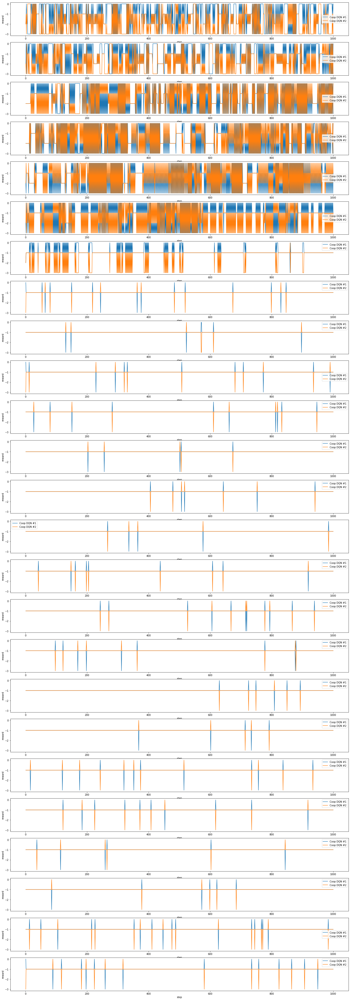

In [16]:
env = IPDEnvironment(num_agents=2, memory_size=1)
agent_factory = lambda: DQNAgent(num_actions=env.get_num_actions(),
                                 network=IPDNetwork(env), lr=1e-4,
                                 gamma=0.95, eps_init=0.9, eps_mult=0.999, eps_min=0.01)
coop_agents = [agent_factory() for _ in range(env.get_num_agents())]
runner = Runner(num_runs=50, num_steps=1000, batch_size=4, replay_size=1000, replay_batch_size=4, coop_reward=True,
                agent_names=['Coop DQN #1', 'Coop DQN #2'], visualize=True, visualize_every=2)
runner.run(env=env, agents=coop_agents)

Run #2...
Total rewards: [-2228 -1208] | Total losses: [869.457247139886, 469.0877945115047]
Run #4...
Total rewards: [-1663 -1630] | Total losses: [958.1451593989041, 569.1633619550848]
Run #6...
Total rewards: [-2007 -1053] | Total losses: [1069.1184678869322, 297.20055478625]
Run #8...
Total rewards: [-2332  -880] | Total losses: [1188.2971535446122, 248.6662073172629]
Run #10...
Total rewards: [-2087 -1112] | Total losses: [2155.347727097571, 265.1647648671642]
Run #12...
Total rewards: [-2049  -570] | Total losses: [1176.4686647334456, 42.47609407060236]
Run #14...
Total rewards: [-1501 -1894] | Total losses: [3064.359272390604, 518.3532940968871]
Run #16...
Total rewards: [-1199 -2390] | Total losses: [2540.2570693194866, 393.4204836040735]
Run #18...
Total rewards: [-1743 -1971] | Total losses: [1639.5617645084858, 306.7136347843334]
Run #20...
Total rewards: [-2048 -1889] | Total losses: [188.01621175886248, 236.81156437534082]
Run #22...
Total rewards: [-1996 -1990] | Total lo

array([-1967.66, -1890.74])

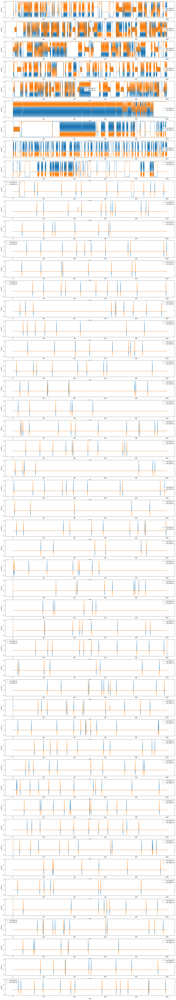

In [17]:
agent_factory = lambda: DQNAgent(num_actions=env.get_num_actions(),
                                 network=IPDNetwork(env), lr=1e-4,
                                 gamma=0.95, eps_init=0.9, eps_mult=0.999, eps_min=0.01)
def_agents = [agent_factory() for _ in range(env.get_num_agents())]
runner = Runner(num_runs=100, num_steps=1000, batch_size=4, replay_size=1000, replay_batch_size=4, coop_reward=False,
                agent_names=['Def DQN #1', 'Def DQN #2'], visualize=True, visualize_every=2)
runner.run(env=env, agents=def_agents)

Run #1...
Total rewards: [-1500     0] | Total losses: [0, 0]
Run #2...
Total rewards: [-1500     0] | Total losses: [0, 0]
Run #3...
Total rewards: [-1500     0] | Total losses: [0, 0]
Run #4...
Total rewards: [-1500     0] | Total losses: [0, 0]
Run #5...
Total rewards: [-1500     0] | Total losses: [0, 0]


array([-1500.,     0.])

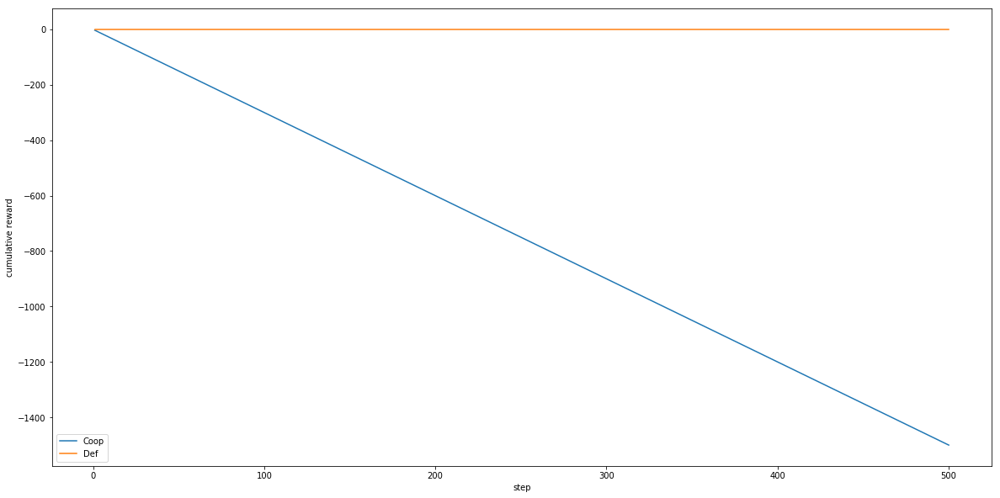

In [18]:
coop_policies = [get_pure_policy(a, do_exploration=False) for a in coop_agents]
def_policies = [get_pure_policy(a, do_exploration=False) for a in def_agents]
agents = [PolicyAgent(coop_policies[0]), PolicyAgent(def_policies[1])]
runner = Runner(num_runs=5, num_steps=500, agent_names=['Coop', 'Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-1500     0] | Total losses: [0, 0]
Run #2...
Total rewards: [-1500     0] | Total losses: [0, 0]
Run #3...
Total rewards: [-1500     0] | Total losses: [0, 0]
Run #4...
Total rewards: [-1500     0] | Total losses: [0, 0]
Run #5...
Total rewards: [-1500     0] | Total losses: [0, 0]


array([-1500.,     0.])

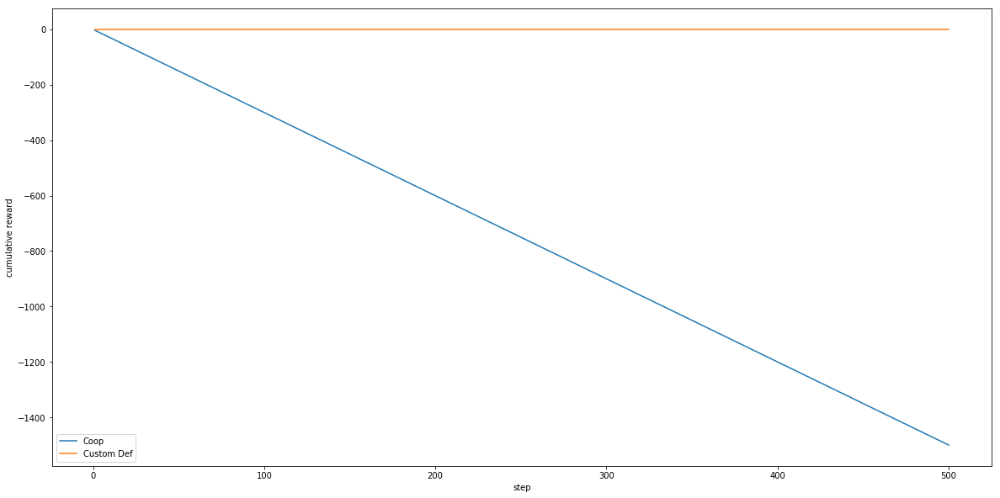

In [19]:
agents = [PolicyAgent(coop_policies[0]), PolicyAgent(OneHotPolicy(IPDEnvironment.DEFECT))]
runner = Runner(num_runs=5, num_steps=500, agent_names=['Coop', 'Custom Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-500 -500] | Total losses: [0, 0]
Run #2...
Total rewards: [-500 -500] | Total losses: [0, 0]
Run #3...
Total rewards: [-500 -500] | Total losses: [0, 0]
Run #4...
Total rewards: [-500 -500] | Total losses: [0, 0]
Run #5...
Total rewards: [-500 -500] | Total losses: [0, 0]


array([-500., -500.])

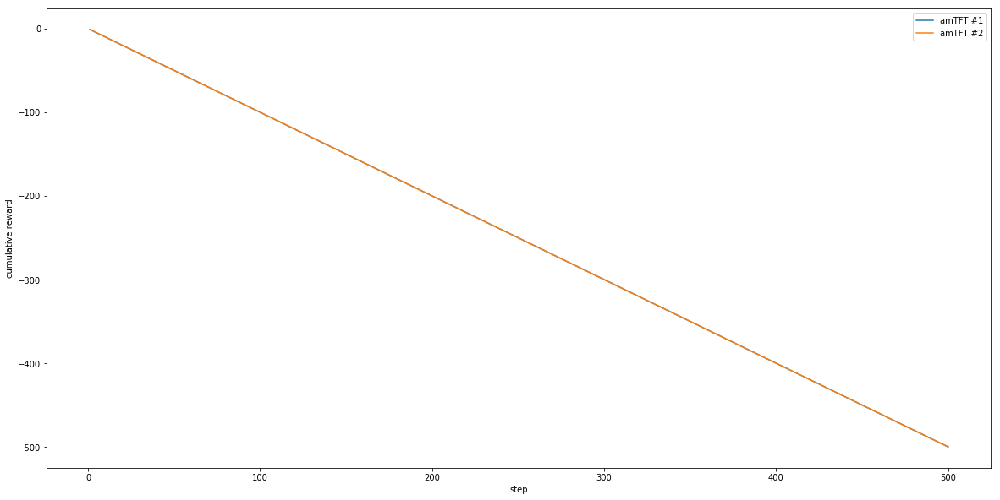

In [20]:
rollouts_runner = Runner(num_runs=30, num_steps=4)
agent_factory = lambda idx: AMTFTAgent(env_copy=deepcopy(env), runner=rollouts_runner, agent_idx=idx,
                                       coop_policies=coop_policies, def_policies=def_policies,
                                       def_limit=0.5, init_def_penalty=1.0)
agents = [agent_factory(idx) for idx in range(env.get_num_agents())]
runner = Runner(num_runs=5, num_steps=500, agent_names=['amTFT #1', 'amTFT #2'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-1167  -666] | Total losses: [0, 0]
Run #2...
Total rewards: [-1167  -666] | Total losses: [0, 0]
Run #3...
Total rewards: [-1167  -666] | Total losses: [0, 0]
Run #4...
Total rewards: [-1167  -666] | Total losses: [0, 0]
Run #5...
Total rewards: [-1167  -666] | Total losses: [0, 0]


array([-1167.,  -666.])

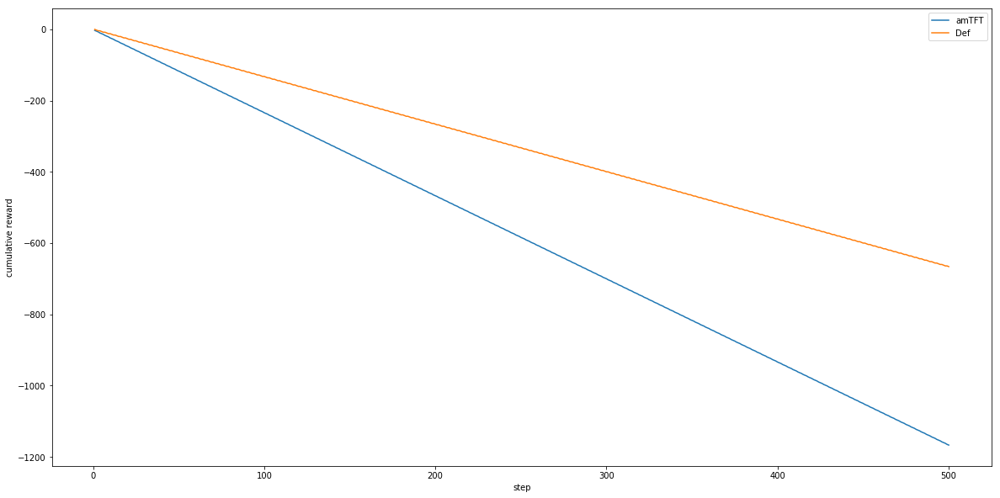

In [21]:
agents = [agent_factory(0), PolicyAgent(def_policies[1])]
runner = Runner(num_runs=5, num_steps=500, agent_names=['amTFT', 'Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-1167  -666] | Total losses: [0, 0]
Run #2...
Total rewards: [-1167  -666] | Total losses: [0, 0]
Run #3...
Total rewards: [-1167  -666] | Total losses: [0, 0]
Run #4...
Total rewards: [-1167  -666] | Total losses: [0, 0]
Run #5...
Total rewards: [-1167  -666] | Total losses: [0, 0]


array([-1167.,  -666.])

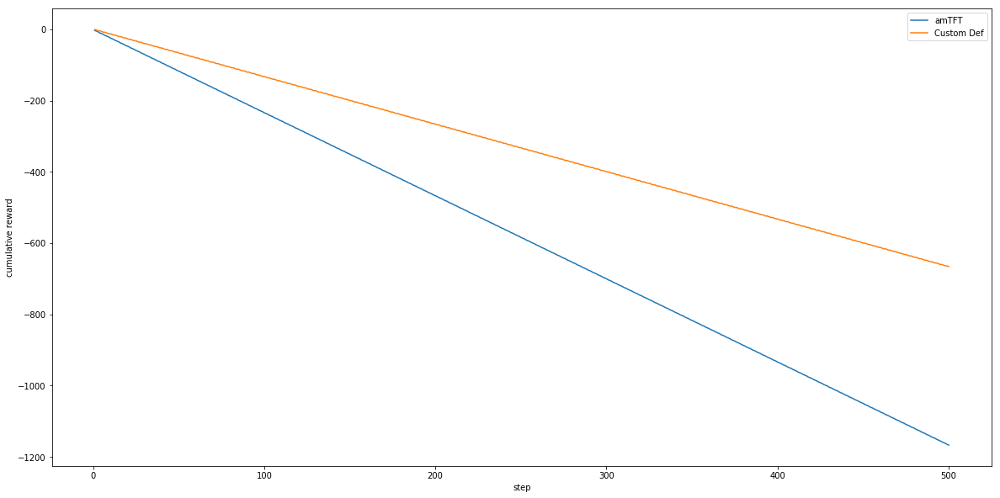

In [22]:
agents = [agent_factory(0), PolicyAgent(OneHotPolicy(IPDEnvironment.DEFECT))]
runner = Runner(num_runs=5, num_steps=500, agent_names=['amTFT', 'Custom Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-500 -500] | Total losses: [0, 0]
Run #2...
Total rewards: [-500 -500] | Total losses: [0, 0]
Run #3...
Total rewards: [-500 -500] | Total losses: [0, 0]
Run #4...
Total rewards: [-500 -500] | Total losses: [0, 0]
Run #5...
Total rewards: [-500 -500] | Total losses: [0, 0]


array([-500., -500.])

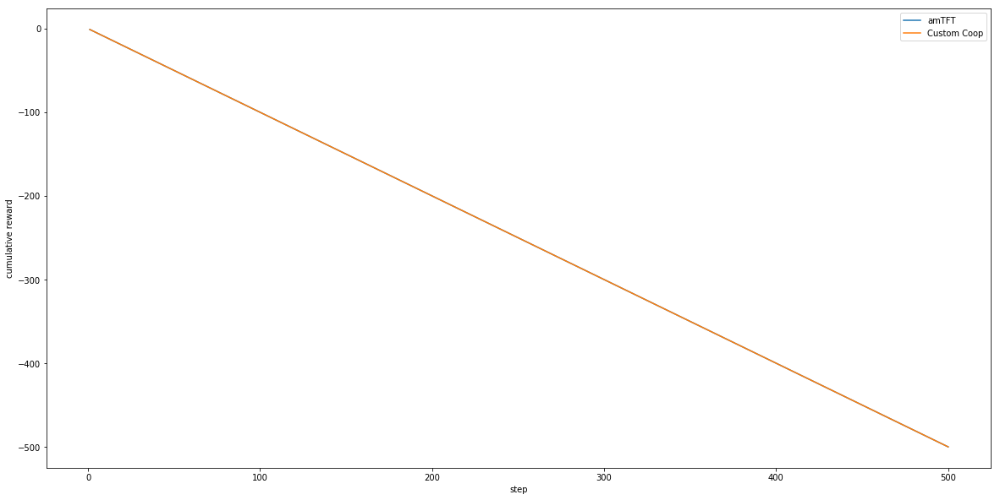

In [23]:
agents = [agent_factory(0), IPDTFTAgent(1)]
runner = Runner(num_runs=5, num_steps=500, agent_names=['amTFT', 'Custom Coop'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

# Experiment: 3-player IPD

Run #4...
Total rewards: [-1515 -1615 -1433] | Total losses: [2020.0219914913177, 2000.9488795995712, 1973.044719696045]
Run #8...
Total rewards: [-1491 -1231 -1569] | Total losses: [1740.5380615592003, 1698.4898926615715, 1896.5188367925584]
Run #12...
Total rewards: [-1518 -1266 -1658] | Total losses: [1713.6940639466047, 1592.8402422964573, 1991.477343171835]
Run #16...
Total rewards: [-1485 -1357 -1465] | Total losses: [1496.3519369401038, 1102.2045771125704, 1840.446295939386]
Run #20...
Total rewards: [-1610 -1394 -1358] | Total losses: [1182.9100563079119, 575.1799596156925, 1944.1504395976663]
Run #24...
Total rewards: [-1006 -1000 -1006] | Total losses: [24.694826861901674, 107.4299923396029, 115.15470988245215]
Run #28...
Total rewards: [ -999 -1011 -1009] | Total losses: [22.612684896979772, 139.6136299718928, 118.8576957905243]
Run #32...
Total rewards: [-1007 -1001 -1005] | Total losses: [27.40148938976199, 78.28467739999178, 91.3978849020641]
Run #36...
Total rewards: [-1

array([-1115.99, -1091.67, -1112.57])

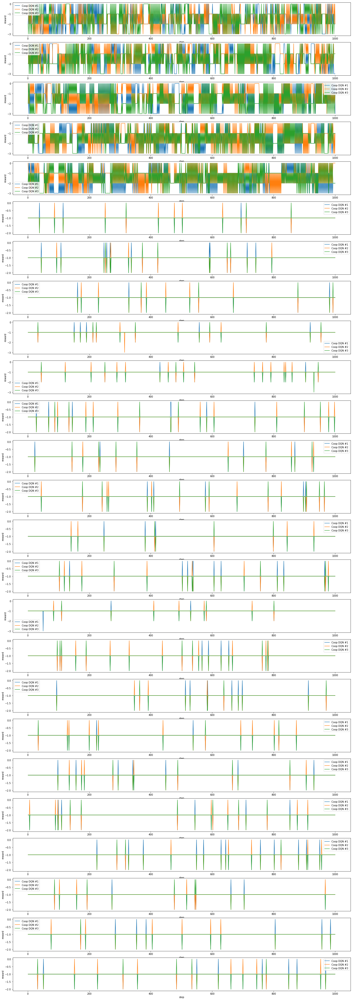

In [24]:
env = IPDEnvironment(num_agents=3, memory_size=1)
agent_factory = lambda: DQNAgent(num_actions=env.get_num_actions(),
                                 network=IPDNetwork(env), lr=1e-4,
                                 gamma=0.95, eps_init=0.9, eps_mult=0.999, eps_min=0.01)
coop_agents = [agent_factory() for _ in range(env.get_num_agents())]
runner = Runner(num_runs=100, num_steps=1000, batch_size=4, replay_size=1000, replay_batch_size=4, coop_reward=True,
                agent_names=['Coop DQN #1', 'Coop DQN #2', 'Coop DQN #3'], visualize=True, visualize_every=4)
runner.run(env=env, agents=coop_agents)

Run #4...
Total rewards: [-1753 -1377 -1631] | Total losses: [646.5307276679669, 500.4267005044967, 545.641407340765]
Run #8...
Total rewards: [-1623 -1385 -1633] | Total losses: [593.1166106387973, 450.2270087003708, 576.3846875503659]
Run #12...
Total rewards: [-1634 -1442 -1696] | Total losses: [637.522354141809, 332.16039378155256, 455.44992232788354]
Run #16...
Total rewards: [-1989 -1969 -1191] | Total losses: [395.6379177607596, 201.96745222061872, 70.54448698100168]
Run #20...
Total rewards: [-1705 -1521 -2285] | Total losses: [390.12982915341854, 167.43498077243567, 366.91100430482766]
Run #24...
Total rewards: [-2046 -1708 -1912] | Total losses: [444.98088354006904, 303.7714468203485, 129.56884350371547]
Run #28...
Total rewards: [-2000 -1994 -1984] | Total losses: [100.63540010868746, 93.66570333117852, 65.5723494095364]
Run #32...
Total rewards: [-1996 -1996 -1996] | Total losses: [58.75253303059435, 50.444984965790354, 29.273497048241552]
Run #36...
Total rewards: [-1988 -

array([-1926.71, -1884.95, -1918.09])

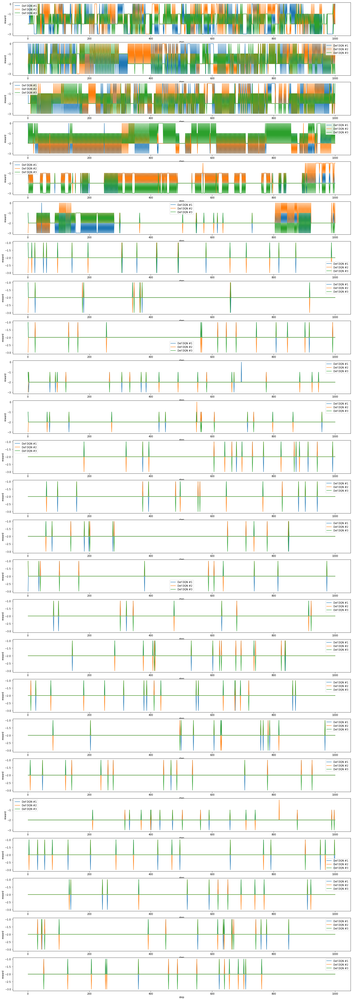

In [25]:
agent_factory = lambda: DQNAgent(num_actions=env.get_num_actions(),
                                 network=IPDNetwork(env), lr=1e-4,
                                 gamma=0.95, eps_init=0.9, eps_mult=0.999, eps_min=0.01)
def_agents = [agent_factory() for _ in range(env.get_num_agents())]
runner = Runner(num_runs=100, num_steps=1000, batch_size=4, replay_size=1000, replay_batch_size=4, coop_reward=False,
                agent_names=['Def DQN #1', 'Def DQN #2', 'Def DQN #3'], visualize=True, visualize_every=4)
runner.run(env=env, agents=def_agents)

Run #1...
Total rewards: [-1000 -1000     0] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [-1000 -1000     0] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [-1000 -1000     0] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [-1000 -1000     0] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-1000 -1000     0] | Total losses: [0, 0, 0]


array([-1000., -1000.,     0.])

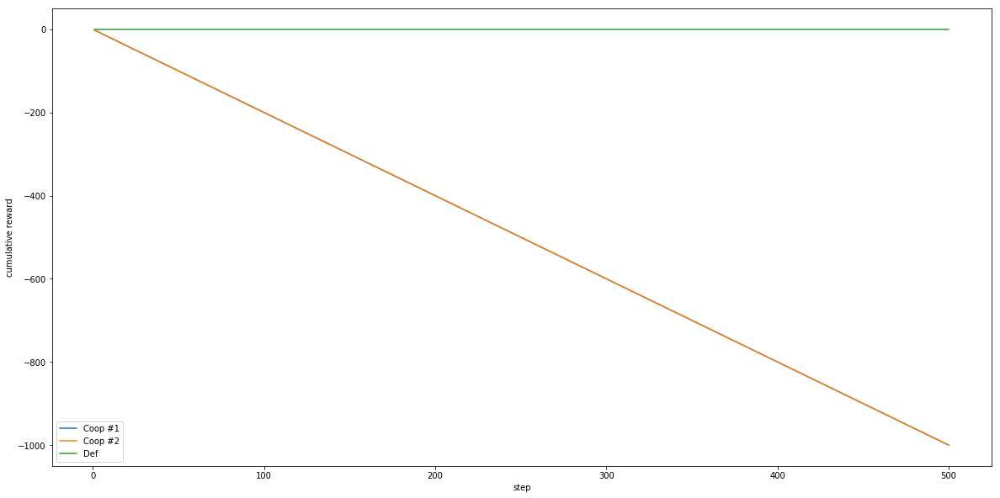

In [26]:
coop_policies = [get_pure_policy(a, do_exploration=False) for a in coop_agents]
def_policies = [get_pure_policy(a, do_exploration=False) for a in def_agents]
agents = [PolicyAgent(coop_policies[0]), PolicyAgent(coop_policies[1]), PolicyAgent(def_policies[2])]
runner = Runner(num_runs=5, num_steps=500, agent_names=['Coop #1', 'Coop #2', 'Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-1000 -1000     0] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [-1000 -1000     0] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [-1000 -1000     0] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [-1000 -1000     0] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-1000 -1000     0] | Total losses: [0, 0, 0]


array([-1000., -1000.,     0.])

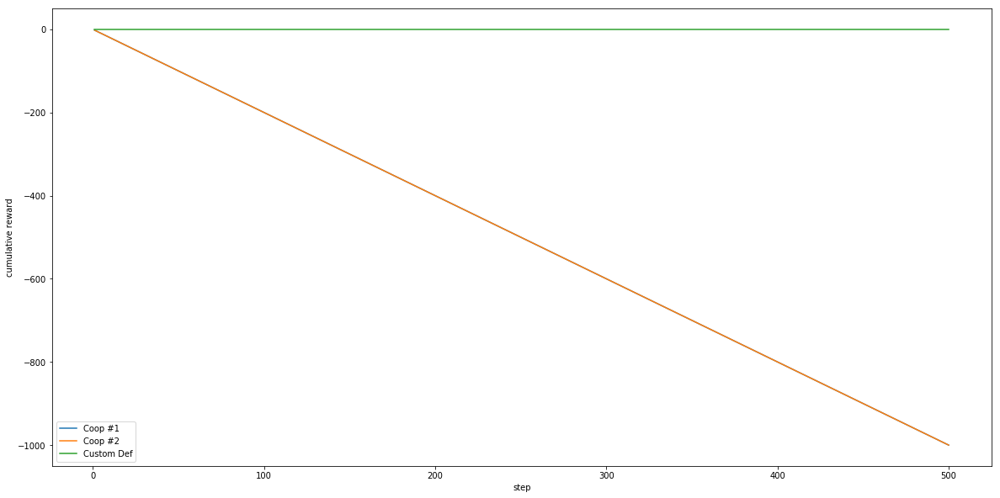

In [27]:
agents = [PolicyAgent(coop_policies[0]), PolicyAgent(coop_policies[1]), PolicyAgent(OneHotPolicy(IPDEnvironment.DEFECT))]
runner = Runner(num_runs=5, num_steps=500, agent_names=['Coop #1', 'Coop #2', 'Custom Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-500 -500 -500] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [-500 -500 -500] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [-500 -500 -500] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [-500 -500 -500] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-500 -500 -500] | Total losses: [0, 0, 0]


array([-500., -500., -500.])

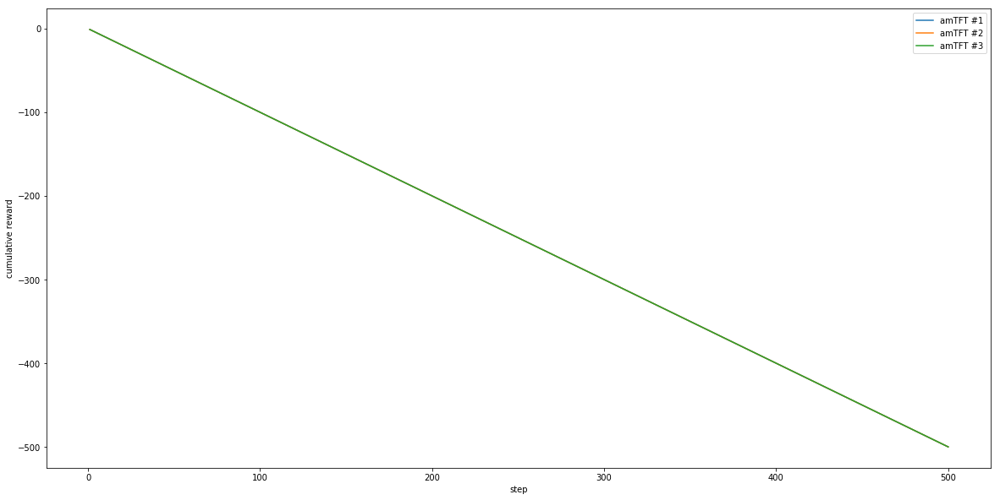

In [28]:
rollouts_runner = Runner(num_runs=30, num_steps=4)
agent_factory = lambda idx: AMTFTAgent(env_copy=deepcopy(env), runner=rollouts_runner, agent_idx=idx,
                                       coop_policies=coop_policies, def_policies=def_policies,
                                       def_limit=0.5, init_def_penalty=1.0)
agents = [agent_factory(idx) for idx in range(env.get_num_agents())]
runner = Runner(num_runs=5, num_steps=500, agent_names=['amTFT #1', 'amTFT #2', 'amTFT #3'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-1000 -1000  -666] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [-1000 -1000  -666] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [-1000 -1000  -666] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [-1000 -1000  -666] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-1000 -1000  -666] | Total losses: [0, 0, 0]


array([-1000., -1000.,  -666.])

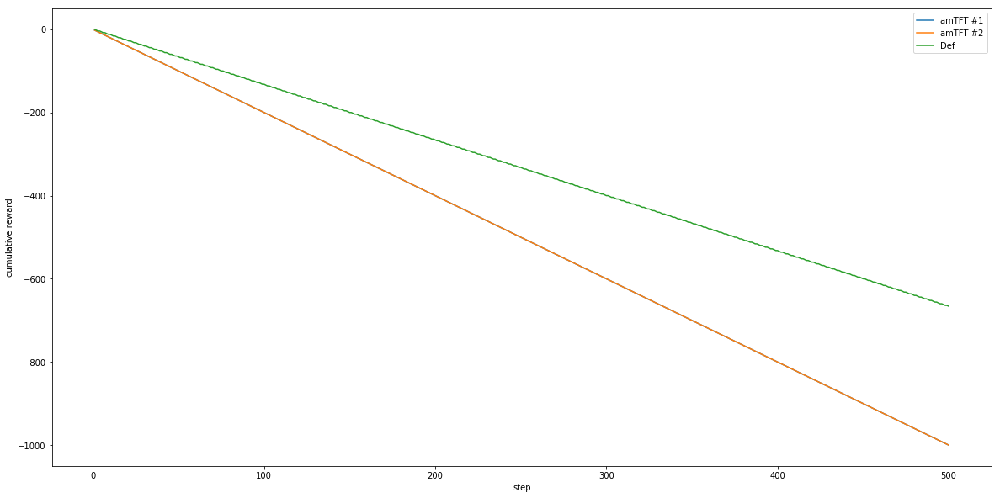

In [29]:
agents = [agent_factory(0), agent_factory(1), PolicyAgent(def_policies[2])]
runner = Runner(num_runs=5, num_steps=500, agent_names=['amTFT #1', 'amTFT #2', 'Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-1000 -1000  -666] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [-1000 -1000  -666] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [-1000 -1000  -666] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [-1000 -1000  -666] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-1000 -1000  -666] | Total losses: [0, 0, 0]


array([-1000., -1000.,  -666.])

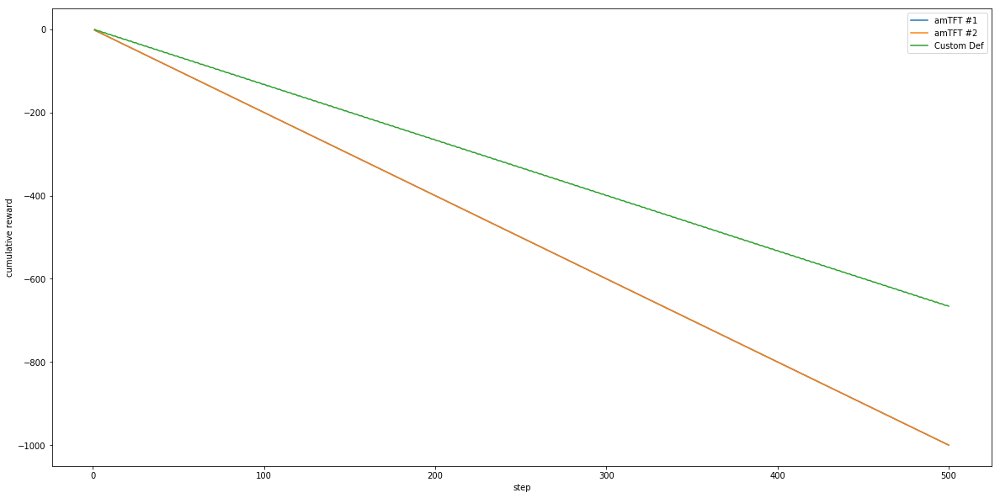

In [30]:
agents = [agent_factory(0), agent_factory(1), PolicyAgent(OneHotPolicy(IPDEnvironment.DEFECT))]
runner = Runner(num_runs=5, num_steps=500, agent_names=['amTFT #1', 'amTFT #2', 'Custom Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-500 -500 -500] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [-500 -500 -500] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [-500 -500 -500] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [-500 -500 -500] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-500 -500 -500] | Total losses: [0, 0, 0]


array([-500., -500., -500.])

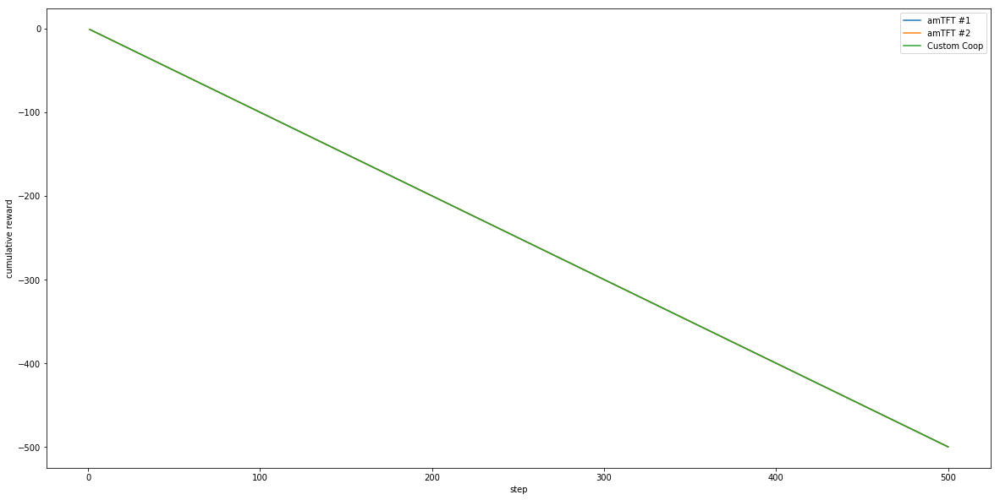

In [31]:
agents = [agent_factory(0), agent_factory(1), IPDTFTAgent(2)]
runner = Runner(num_runs=5, num_steps=500, agent_names=['amTFT #1', 'amTFT #2', 'Custom Coop'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

# Experiment: 2-player Coins

Run #4...
Total rewards: [40. -8.] | Total losses: [240.3068857107105, 240.29236346087964]
Run #8...
Total rewards: [ 398. -247.] | Total losses: [245.37845807398844, 245.54368501123827]
Run #12...
Total rewards: [314.   8.] | Total losses: [242.7142292458302, 243.23211257400908]
Run #16...
Total rewards: [244. -52.] | Total losses: [240.35857594576373, 239.8817110606833]
Run #20...
Total rewards: [-78. 423.] | Total losses: [223.9622878836526, 225.61394499911694]
Run #24...
Total rewards: [186. 329.] | Total losses: [240.505761457287, 240.77458763867617]
Run #28...
Total rewards: [451. 242.] | Total losses: [235.20453069612267, 236.26688653463498]
Run #32...
Total rewards: [608. 225.] | Total losses: [231.55482832388952, 230.3829291908769]
Run #36...
Total rewards: [271. 512.] | Total losses: [223.93044982579886, 224.0169798908173]
Run #40...
Total rewards: [736. 145.] | Total losses: [231.29914900904987, 229.81025143910665]
Run #44...
Total rewards: [612. 489.] | Total losses: [226.0

array([1274.664, 1263.876])

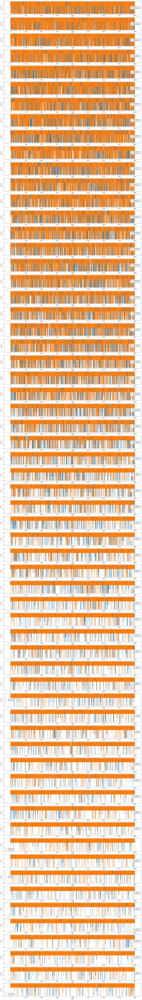

In [16]:
env = CoinsEnvironment(num_agents=2, size=5)
agent_factory = lambda: DQNAgent(num_actions=env.get_num_actions(),
                                 network=CoinsConvNetwork(env).to(device), lr=1e-4,
                                 gamma=0.95, eps_init=0.9, eps_mult=0.999999, eps_min=0.05)
coop_agents = [agent_factory() for _ in range(env.get_num_agents())]
runner = Runner(num_runs=250, num_steps=2*10**4, batch_size=16, replay_size=10**4, replay_batch_size=16, coop_reward=True,
                agent_names=['Coop DQN #1', 'Coop DQN #2'], visualize=True, visualize_every=4)
runner.run(env=env, agents=coop_agents)

Run #4...
Total rewards: [-119.  -32.] | Total losses: [274.442069214012, 278.0090787818772]
Run #8...
Total rewards: [-546.  452.] | Total losses: [289.80958357402415, 266.7847885462106]
Run #12...
Total rewards: [-678.  564.] | Total losses: [311.55910870077787, 269.8967372814659]
Run #16...
Total rewards: [-326.  388.] | Total losses: [266.43962671860936, 249.1152220548247]
Run #20...
Total rewards: [-49. -87.] | Total losses: [275.1648108851514, 275.37580948736286]
Run #24...
Total rewards: [ 75. -43.] | Total losses: [266.17613678600173, 256.1038109664223]
Run #28...
Total rewards: [ -65. -111.] | Total losses: [282.2269928751921, 283.3056293508853]
Run #32...
Total rewards: [-195. -160.] | Total losses: [279.45571797163575, 274.8975821688946]
Run #36...
Total rewards: [ -83. -500.] | Total losses: [269.11391125869704, 290.244777962027]
Run #40...
Total rewards: [ 357. -525.] | Total losses: [251.48065577214584, 269.97211063261784]
Run #44...
Total rewards: [ 140. -244.] | Total l

KeyboardInterrupt: 

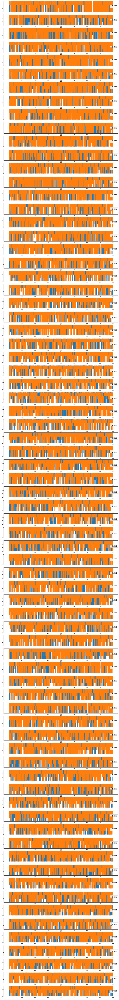

In [17]:
agent_factory = lambda: DQNAgent(num_actions=env.get_num_actions(),
                                 network=CoinsConvNetwork(env).to(device), lr=1e-4,
                                 gamma=0.95, eps_init=0.9, eps_mult=0.999999, eps_min=0.05)
def_agents = [agent_factory() for _ in range(env.get_num_agents())]
runner = Runner(num_runs=300, num_steps=2*10**4, batch_size=16, replay_size=10**4, replay_batch_size=16, coop_reward=False,
                agent_names=['Def DQN #1', 'Def DQN #2'], visualize=True, visualize_every=4)
runner.run(env=env, agents=def_agents)

Run #1...
Total rewards: [-39. 145.] | Total losses: [0, 0]
Run #2...
Total rewards: [-12. 143.] | Total losses: [0, 0]
Run #3...
Total rewards: [ -8. 132.] | Total losses: [0, 0]
Run #4...
Total rewards: [-46. 153.] | Total losses: [0, 0]
Run #5...
Total rewards: [-125.  158.] | Total losses: [0, 0]


array([-46. , 146.2])

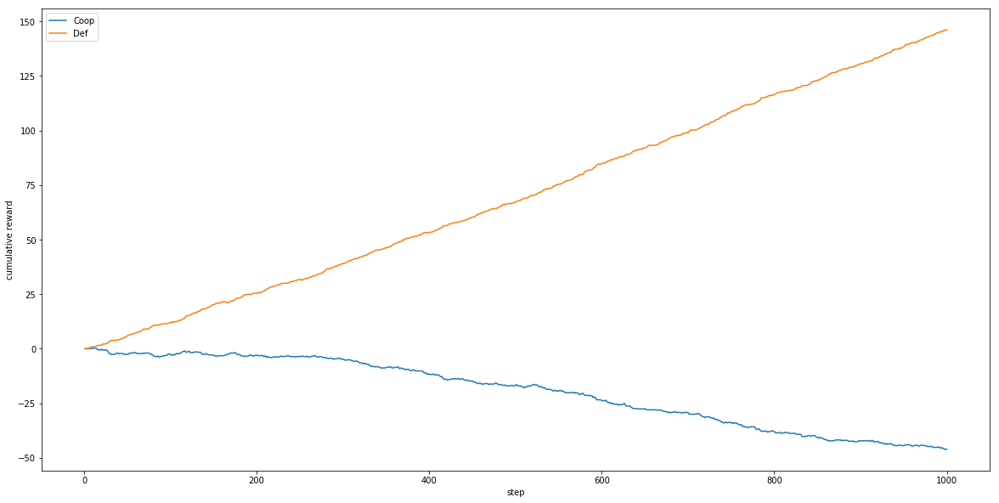

In [18]:
coop_policies = [get_pure_policy(a, do_exploration=False) for a in coop_agents]
def_policies = [get_pure_policy(a, do_exploration=False) for a in def_agents]
agents = [PolicyAgent(coop_policies[0]), PolicyAgent(def_policies[1])]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['Coop', 'Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-76. 160.] | Total losses: [0, 0]
Run #2...
Total rewards: [-57. 164.] | Total losses: [0, 0]
Run #3...
Total rewards: [-78. 168.] | Total losses: [0, 0]
Run #4...
Total rewards: [-12. 137.] | Total losses: [0, 0]
Run #5...
Total rewards: [-85. 159.] | Total losses: [0, 0]


array([-61.6, 157.6])

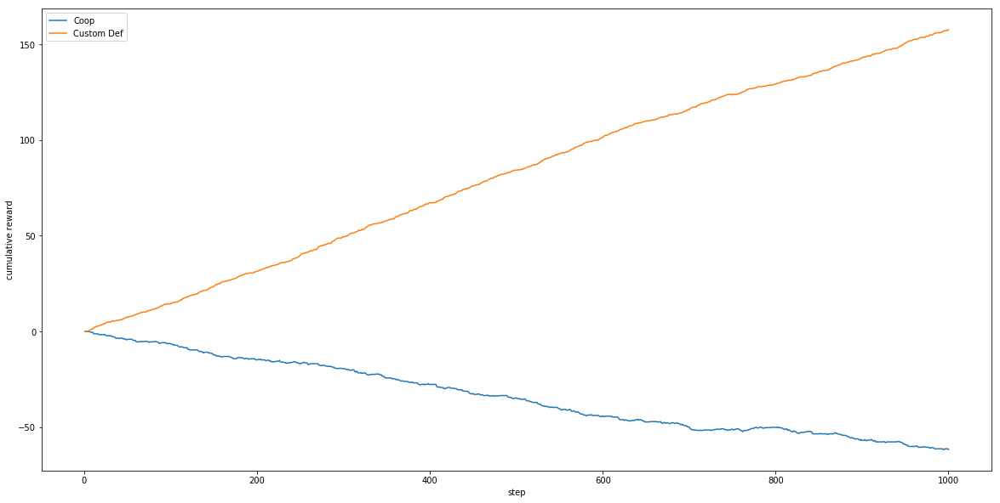

In [19]:
agents = [PolicyAgent(coop_policies[0]), CoinsGreedyAgent(coins_env=env, agent_idx=1, own_coins_only=False)]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['Coop', 'Custom Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [87. 89.] | Total losses: [0, 0]
Run #2...
Total rewards: [85. 85.] | Total losses: [0, 0]
Run #3...
Total rewards: [ 74. 106.] | Total losses: [0, 0]
Run #4...
Total rewards: [94. 97.] | Total losses: [0, 0]
Run #5...
Total rewards: [82. 88.] | Total losses: [0, 0]


array([84.4, 93. ])

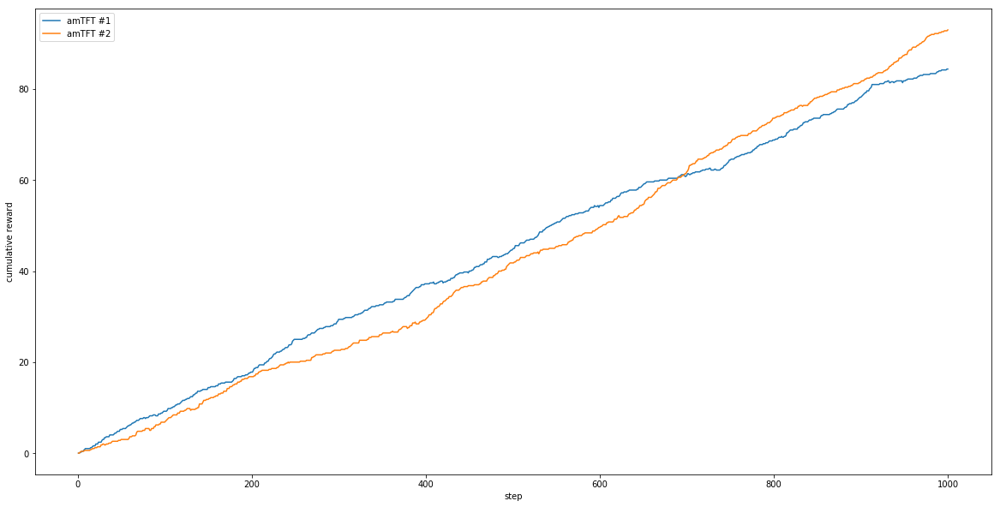

In [20]:
rollouts_runner = Runner(num_runs=30, num_steps=50)
agent_factory = lambda idx: AMTFTAgent(env_copy=deepcopy(env), runner=rollouts_runner, agent_idx=idx,
                                       coop_policies=coop_policies, def_policies=def_policies,
                                       def_limit=1.0, init_def_penalty=3.0)
agents = [agent_factory(idx) for idx in range(env.get_num_agents())]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['amTFT #1', 'amTFT #2'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-2. 62.] | Total losses: [0, 0]
Run #2...
Total rewards: [29. 63.] | Total losses: [0, 0]
Run #3...
Total rewards: [27. 30.] | Total losses: [0, 0]
Run #4...
Total rewards: [-22.  71.] | Total losses: [0, 0]
Run #5...
Total rewards: [12. 58.] | Total losses: [0, 0]


array([ 8.8, 56.8])

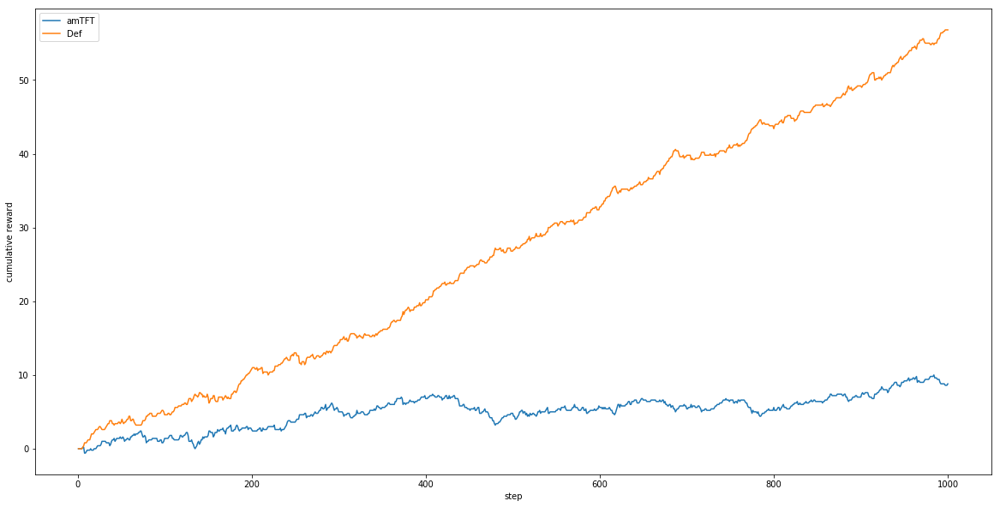

In [21]:
agents = [agent_factory(0), PolicyAgent(def_policies[1])]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['amTFT', 'Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-10.  57.] | Total losses: [0, 0]
Run #2...
Total rewards: [-38.  75.] | Total losses: [0, 0]
Run #3...
Total rewards: [-28.  52.] | Total losses: [0, 0]
Run #4...
Total rewards: [-1. 55.] | Total losses: [0, 0]
Run #5...
Total rewards: [-34.  62.] | Total losses: [0, 0]


array([-22.2,  60.2])

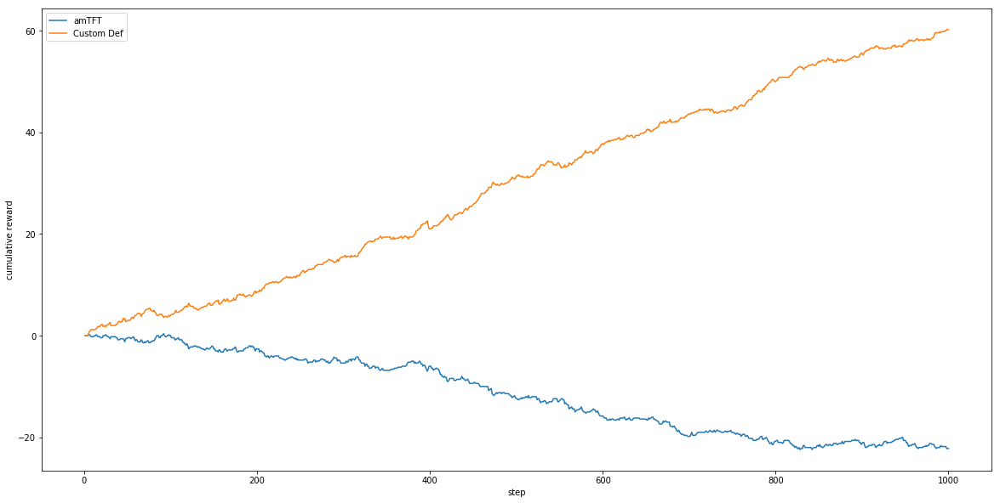

In [22]:
agents = [agent_factory(0), CoinsGreedyAgent(coins_env=env, agent_idx=1, own_coins_only=False)]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['amTFT', 'Custom Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [108.  47.] | Total losses: [0, 0]
Run #2...
Total rewards: [114.  48.] | Total losses: [0, 0]
Run #3...
Total rewards: [105.  44.] | Total losses: [0, 0]
Run #4...
Total rewards: [120.  46.] | Total losses: [0, 0]
Run #5...
Total rewards: [100.  59.] | Total losses: [0, 0]


array([109.4,  48.8])

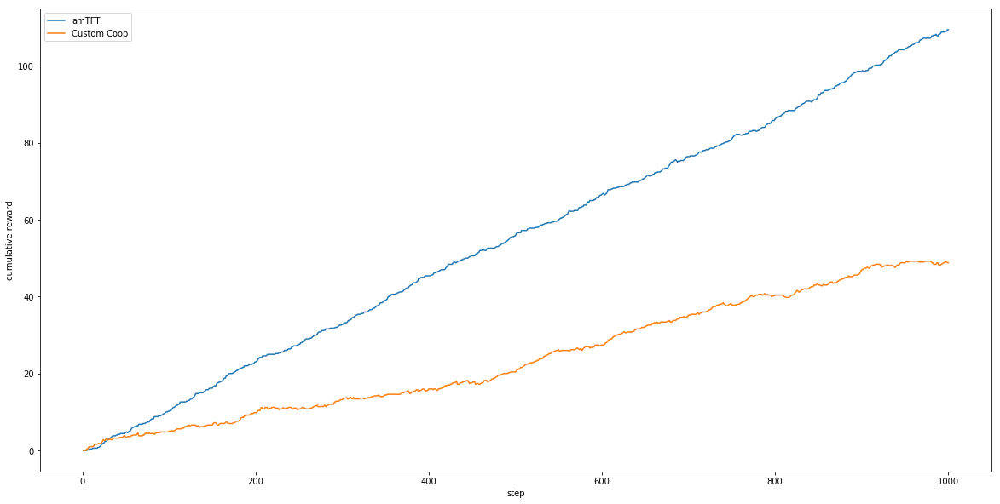

In [23]:
agents = [agent_factory(0), CoinsGreedyAgent(coins_env=env, agent_idx=1, own_coins_only=True)]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['amTFT', 'Custom Coop'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

# Experiment: 3-player Coins

In [18]:
for i in range(3):
    #with open('coop{}.pt'.format(i), 'wb') as f:
    with open('coop{}.pt'.format(i), 'rb') as f:
        #torch.save(coop_agents[i].network, f)
        coop_agents[i].network = torch.load(f)
    #with open('def{}.pt'.format(i), 'wb') as f:
    with open('def{}.pt'.format(i), 'rb') as f:
        #torch.save(def_agents[i].network, f)
        def_agents[i].network = torch.load(f)

Run #50...
Total rewards: [-79. -61. -53.] | Total losses: [15.211158745349167, 15.296246659290773, 15.548609090699756]
Run #100...
Total rewards: [-16. -63. -67.] | Total losses: [14.607740288707134, 15.026799179154295, 14.174054338379282]
Run #150...
Total rewards: [-70. -35. -29.] | Total losses: [13.266247389956975, 13.275527745102536, 14.04408508215215]
Run #200...
Total rewards: [-57. -31. -25.] | Total losses: [13.468271135870054, 12.501919651164826, 12.957814365003514]
Run #250...
Total rewards: [ -68.  -29. -109.] | Total losses: [13.001842320300057, 12.609973947823164, 13.17568765917531]
Run #300...
Total rewards: [-77. -31. -58.] | Total losses: [11.302318314391698, 10.569116097007594, 11.09066442465263]
Run #350...
Total rewards: [ -43.   17. -100.] | Total losses: [13.636282873433458, 12.08198496694581, 12.118994960299005]
Run #400...
Total rewards: [ -32.  -19. -101.] | Total losses: [13.654015210748184, 12.820986592634, 12.780825741087028]
Run #450...
Total rewards: [-11

array([58.415, 91.957, 69.345])

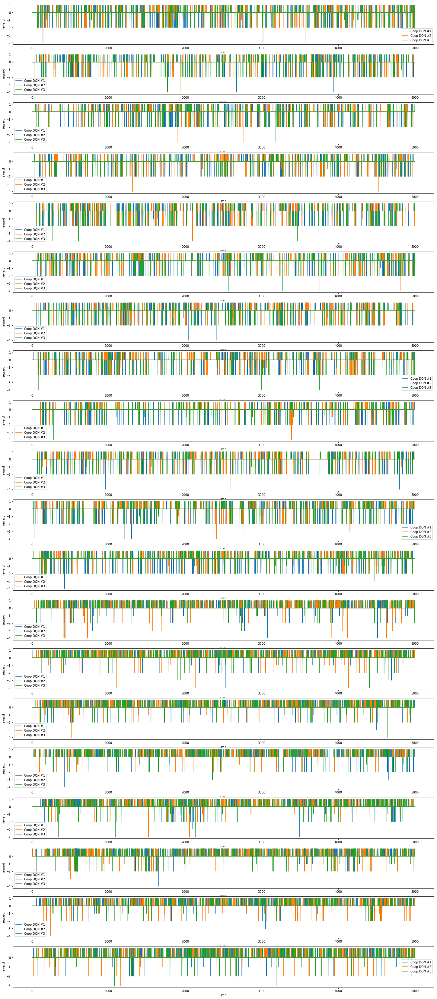

In [24]:
env = CoinsEnvironment(num_agents=3, size=5)
agent_factory = lambda: DQNAgent(num_actions=env.get_num_actions(),
                                 network=CoinsConvNetwork(env).to(device), lr=1e-4,
                                 gamma=0.95, eps_init=0.9, eps_mult=0.999995, eps_min=0.05)
coop_agents = [agent_factory() for _ in range(env.get_num_agents())]
runner = Runner(num_runs=1000, num_steps=5000, batch_size=32, replay_size=5000, coop_reward=True,
                agent_names=['Coop DQN #1', 'Coop DQN #2', 'Coop DQN #3'], visualize=True, visualize_every=50)
runner.run(env=env, agents=coop_agents)

Run #50...
Total rewards: [292. 295. 320.] | Total losses: [21.049855570076033, 20.886520457919687, 20.658224188606255]
Run #100...
Total rewards: [274. 321. 268.] | Total losses: [20.719186179776443, 19.80984257743694, 19.02568735933164]
Run #150...
Total rewards: [330. 291. 268.] | Total losses: [21.110249677236425, 22.416136874468066, 21.10196189727867]
Run #200...
Total rewards: [298. 294. 235.] | Total losses: [23.05389394244412, 20.723749010940082, 20.789688397489954]
Run #250...
Total rewards: [331. 339. 251.] | Total losses: [21.737687062472105, 23.15062727825716, 22.136659835465252]
Run #300...
Total rewards: [324. 274. 280.] | Total losses: [19.993341023335233, 20.95756509085186, 21.314528373535722]
Run #350...
Total rewards: [274. 311. 293.] | Total losses: [21.0074292315403, 22.062389233033173, 20.896990483161062]
Run #400...
Total rewards: [302. 261. 288.] | Total losses: [19.362027112627402, 21.50111220375402, 20.212691227614414]


KeyboardInterrupt: 

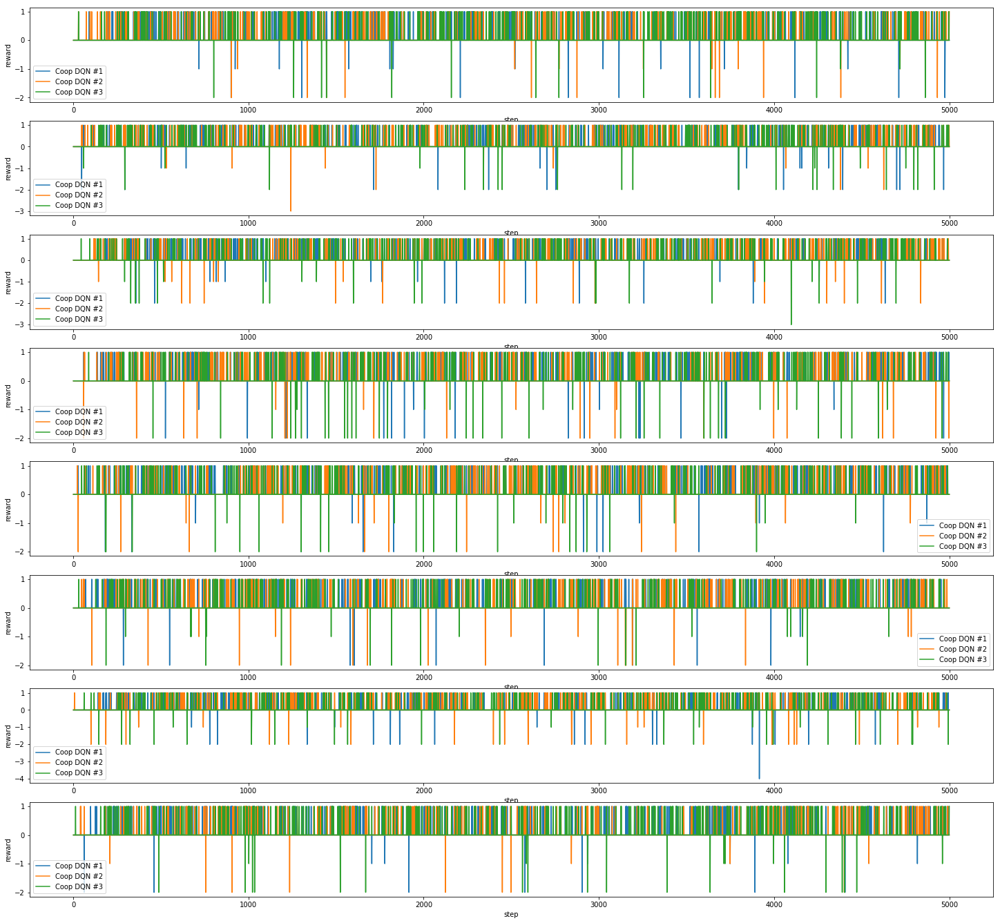

In [27]:
runner.run(env=env, agents=coop_agents)

Run #50...
Total rewards: [-87. -73.  32.] | Total losses: [7.160903165698983, 6.128164557099808, 5.823977645457489]
Run #100...
Total rewards: [-89. -32. -16.] | Total losses: [7.064452099439222, 4.4488762622349896, 4.932054921548115]
Run #150...
Total rewards: [-26. -40. -58.] | Total losses: [7.1920831330207875, 5.477238269086229, 7.348447603988461]
Run #200...
Total rewards: [ -32.   -2. -102.] | Total losses: [5.810563366889255, 6.146766344027128, 6.5067282302479725]
Run #250...
Total rewards: [ -26.    2. -104.] | Total losses: [5.802384637820069, 5.436329564719927, 6.105635112362506]
Run #300...
Total rewards: [   7.   -5. -142.] | Total losses: [5.938782164565055, 5.805808522214647, 5.45867763190472]
Run #350...
Total rewards: [-39.  -9. -79.] | Total losses: [5.699530441546813, 6.279415058728773, 7.070062562212115]
Run #400...
Total rewards: [ -5. -39. -85.] | Total losses: [6.55633950108313, 6.692519984440878, 6.433371804072522]
Run #450...
Total rewards: [-38.  -8. -88.] | T

array([-39.4025, -27.468 , -71.603 ])

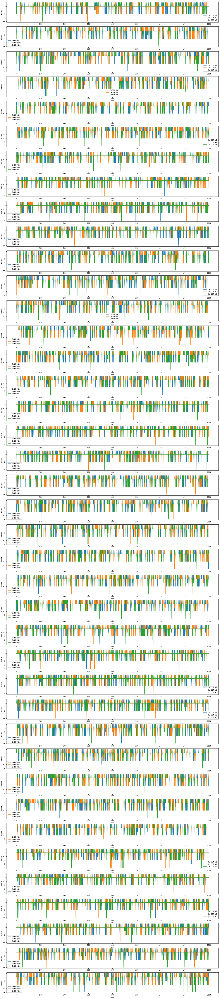

In [19]:
agent_factory = lambda: DQNAgent(num_actions=env.get_num_actions(),
                                 network=CoinsConvNetwork(env, drop_coin_col=True).to(device), lr=1e-4,
                                 gamma=0.95, eps_init=0.9, eps_mult=0.999995, eps_min=0.05)
def_agents = [agent_factory() for _ in range(env.get_num_agents())]
runner = Runner(num_runs=2000, num_steps=2000, batch_size=32, replay_size=0, coop_reward=False,
                agent_names=['Def DQN #1', 'Def DQN #2', 'Def DQN #3'], visualize=True, visualize_every=50)
runner.run(env=env, agents=def_agents)

Run #1...
Total rewards: [-108.  -99.  166.] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [-121. -114.  187.] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [-33. -40.  66.] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [-110.  -97.  161.] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-122. -142.  191.] | Total losses: [0, 0, 0]


array([-98.8, -98.4, 154.2])

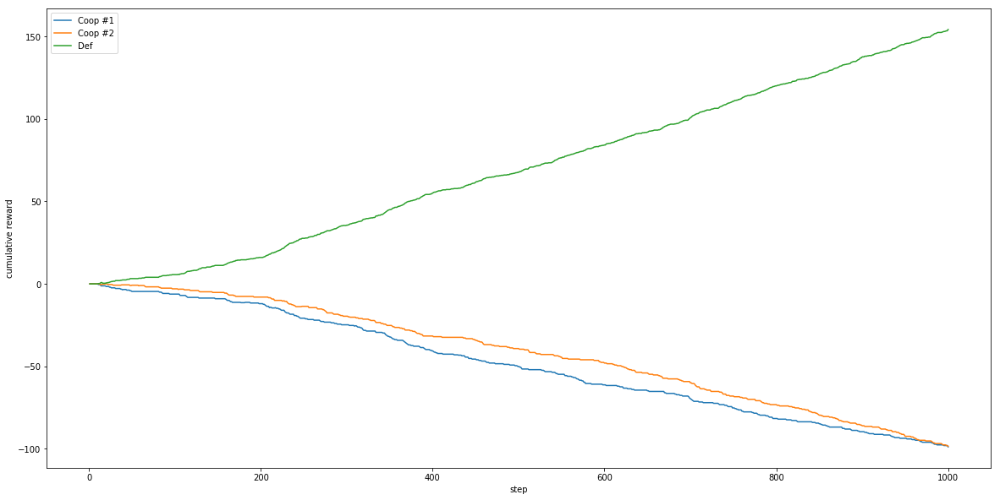

In [20]:
coop_policies = [get_pure_policy(a, do_exploration=False) for a in coop_agents]
def_policies = [get_pure_policy(a, do_exploration=False) for a in def_agents]
agents = [PolicyAgent(coop_policies[0]), PolicyAgent(coop_policies[1]), PolicyAgent(def_policies[2])]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['Coop #1', 'Coop #2', 'Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-135. -128.  193.] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [-122. -100.  176.] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [-130.  -91.  185.] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [-150. -107.  198.] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-126. -112.  197.] | Total losses: [0, 0, 0]


array([-132.6, -107.6,  189.8])

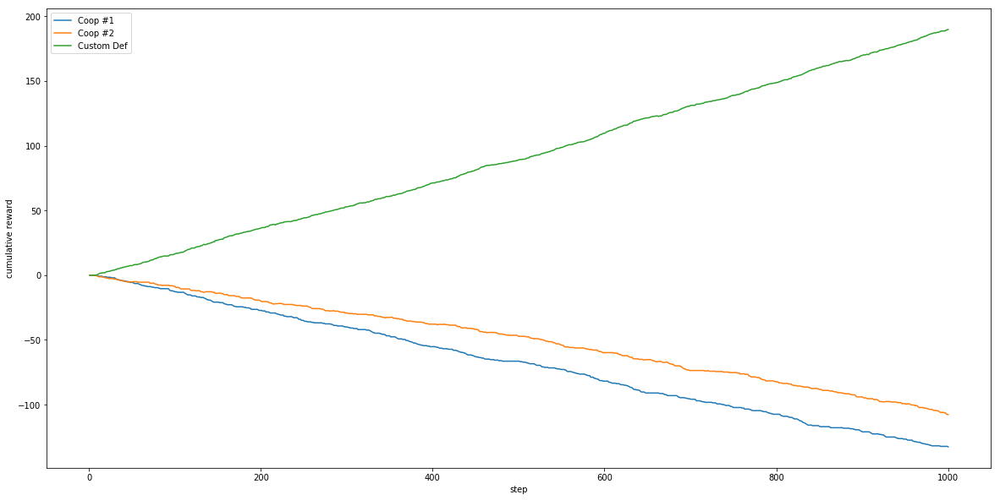

In [21]:
agents = [PolicyAgent(coop_policies[0]), PolicyAgent(coop_policies[1]), CoinsGreedyAgent(coins_env=env, agent_idx=2, own_coins_only=False)]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['Coop #1', 'Coop #2', 'Custom Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [66. 46. 68.] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [63. 42. 64.] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [63. 50. 55.] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [48. 80. 60.] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [52. 67. 46.] | Total losses: [0, 0, 0]


array([58.4, 57. , 58.6])

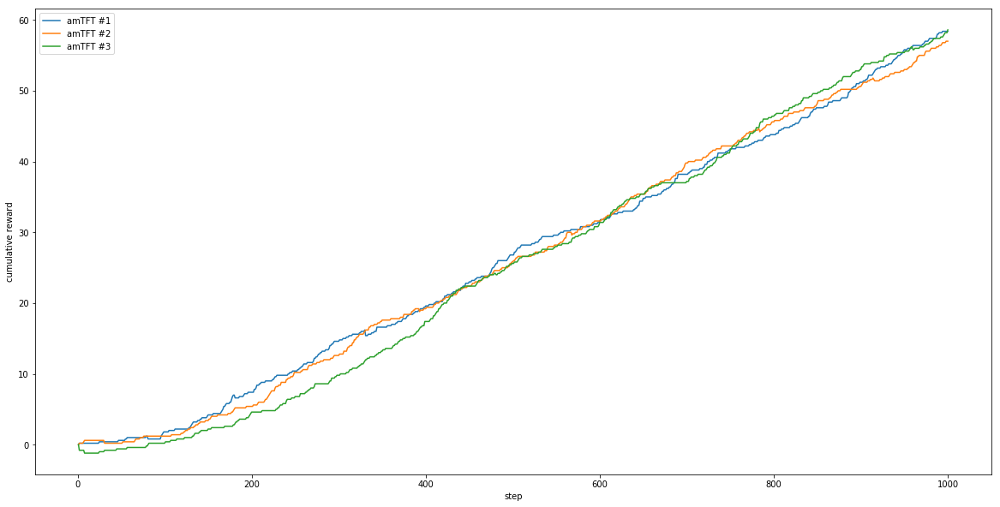

In [29]:
rollouts_runner = Runner(num_runs=20, num_steps=50)
agent_factory = lambda idx: AMTFTAgent(env_copy=deepcopy(env), runner=rollouts_runner, agent_idx=idx,
                                       coop_policies=coop_policies, def_policies=def_policies,
                                       def_limit=1.0, init_def_penalty=3.0)
agents = [agent_factory(idx) for idx in range(env.get_num_agents())]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['amTFT #1', 'amTFT #2', 'amTFT #3'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-13.  -8. -48.] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [-40.   6. -32.] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [-32.   2. -64.] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [-29. -31. -27.] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-36.  19. -23.] | Total losses: [0, 0, 0]


array([-30. ,  -2.4, -38.8])

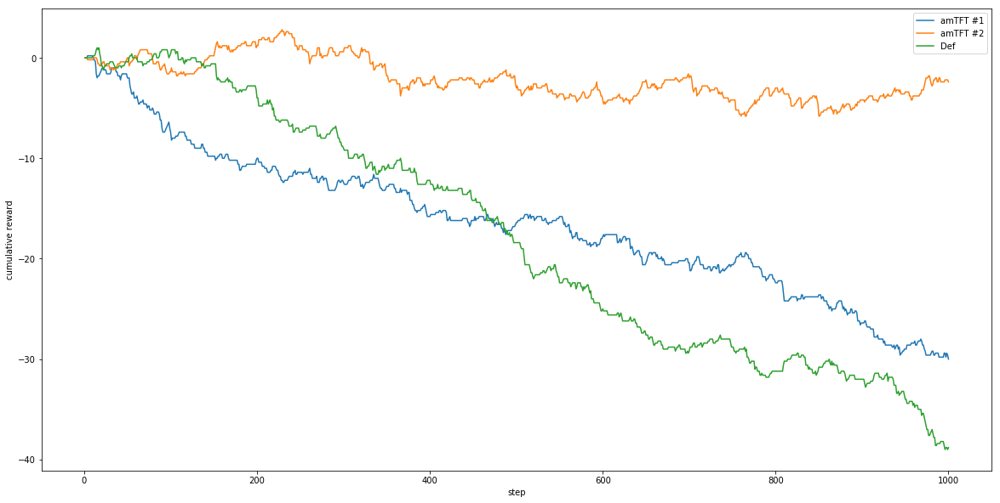

In [21]:
agents = [agent_factory(0), agent_factory(1), PolicyAgent(def_policies[2])]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['amTFT #1', 'amTFT #2', 'Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [-58. -62.  53.] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [-92. -75.  71.] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [-79. -59.  64.] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [-67. -51.  29.] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-69. -67.  48.] | Total losses: [0, 0, 0]


array([-73. , -62.8,  53. ])

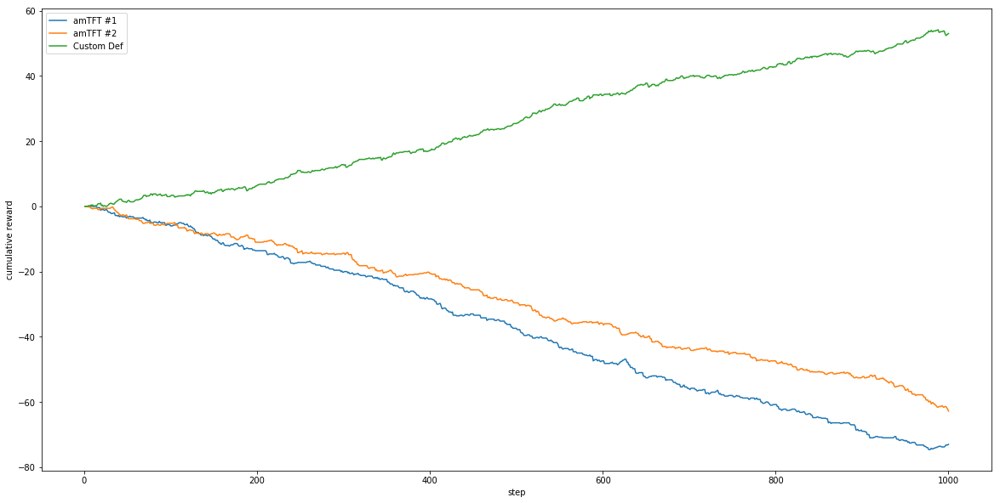

In [23]:
agents = [agent_factory(0), agent_factory(1), CoinsGreedyAgent(coins_env=env, agent_idx=2, own_coins_only=False)]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['amTFT #1', 'amTFT #2', 'Custom Def'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)

Run #1...
Total rewards: [ 2. 13. 13.] | Total losses: [0, 0, 0]
Run #2...
Total rewards: [ 18.  23. -25.] | Total losses: [0, 0, 0]
Run #3...
Total rewards: [ 7. 18.  7.] | Total losses: [0, 0, 0]
Run #4...
Total rewards: [ -2.  19. -20.] | Total losses: [0, 0, 0]
Run #5...
Total rewards: [-18.  26.   8.] | Total losses: [0, 0, 0]


array([ 1.4, 19.8, -3.4])

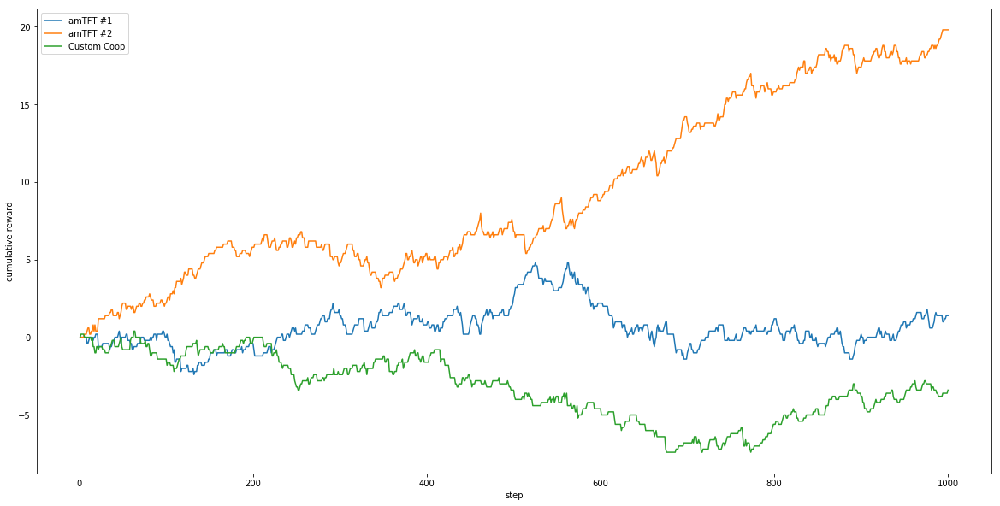

In [22]:
agents = [agent_factory(0), agent_factory(1), CoinsGreedyAgent(coins_env=env, agent_idx=2, own_coins_only=True)]
runner = Runner(num_runs=5, num_steps=1000, agent_names=['amTFT #1', 'amTFT #2', 'Custom Coop'], visualize=True, vis_summary_only=True)
runner.run(env=env, agents=agents)